In [1]:
# program to handle missing value and duplicated value

import pandas as pd

In [2]:
df={'Name':['Aashvi','Suchit','Doremon','NaN'],
   'Game':['Soccer','NaN','Carrom','cycling'],
   'time_taken':[70,30,None,60]}

In [3]:
df=pd.DataFrame(df)

In [4]:
df

,Name,Game,time_taken
0,Aashvi,Soccer,70.0
1,Suchit,NaN,30.0
2,Doremon,Carrom,NaN
3,NaN,cycling,60.0


In [5]:
df_out_M=df.dropna()

In [6]:
df_out_M

,Name,Game,time_taken
0,Aashvi,Soccer,70.0
1,Suchit,NaN,30.0
3,NaN,cycling,60.0


In [7]:
df_fill=df.fillna(method='ffill')

In [8]:
df_fill

,Name,Game,time_taken
0,Aashvi,Soccer,70.0
1,Suchit,NaN,30.0
2,Doremon,Carrom,30.0
3,NaN,cycling,60.0


In [9]:
columns_mean=df.mean()

C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3089537959.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  columns_mean=df.mean()


In [10]:
df_filled=df.fillna(columns_mean)

In [11]:
df_filled

,Name,Game,time_taken
0,Aashvi,Soccer,70.000000
1,Suchit,NaN,30.000000
2,Doremon,Carrom,53.333333
3,NaN,cycling,60.000000


In [12]:
df.drop_duplicates()

,Name,Game,time_taken
0,Aashvi,Soccer,70.0
1,Suchit,NaN,30.0
2,Doremon,Carrom,NaN
3,NaN,cycling,60.0


In [13]:
# Simple linear regression using hardcode

import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

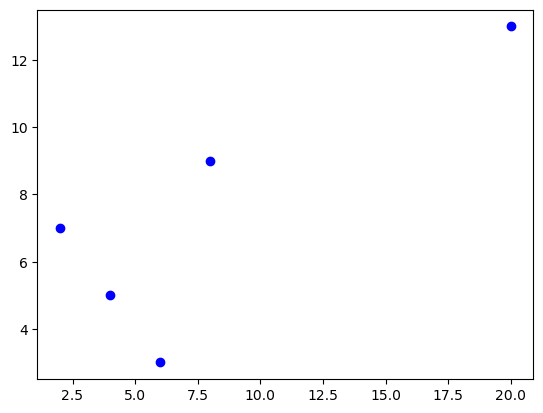

In [14]:
x=np.array([2,4,6,8,20]).reshape((-1,1))
y=np.array([7,5,3,9,13])
plt.plot(x,y,'o',color='blue')
plt.show()

In [15]:
mean_x=np.mean(x)
mean_y=np.mean(y)

In [16]:
n=len(x)
print('length',n)

length 5


In [17]:
import math
for i in range(n):
    num=(x[i]-mean_x)*(y[i]-mean_y)
    den=(x[i]-mean_x)**2

b1=num/den
bo=mean_y-(b1*mean_x)

print('slope',b1)
print('intercept',bo)

slope [0.46666667]
intercept [3.66666667]


In [18]:

y_pred=b1*x+bo
print('predict:',y_pred)

predict: [[ 4.6       ]
 [ 5.53333333]
 [ 6.46666667]
 [ 7.4       ]
 [13.        ]]


In [19]:

RSS=np.sum((y-y_pred)**2)
TSS=np.sum((y-mean_y)**2)
R2=1-(RSS/TSS)
print('rsquare:',R2)

rsquare: -7.678678678678677


In [20]:
MSE=np.sum((y-y_pred)**2)/n
RMSE=np.sqrt(MSE)
print('RMSE:',RMSE)

RMSE: 10.136841497999047


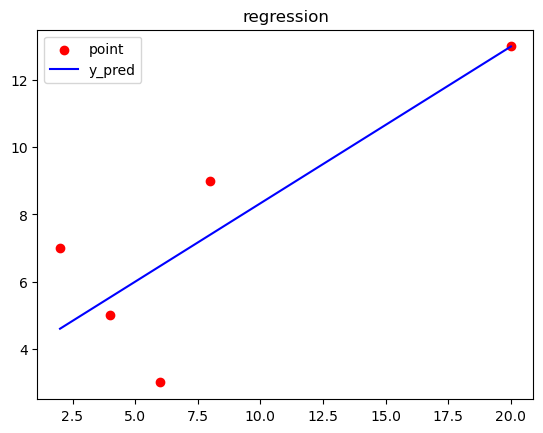

In [21]:
plt.scatter(x,y,color='red')
plt.plot(x,y_pred,color='b')
plt.legend(['point','y_pred'])
plt.title('regression')
plt.show()

In [22]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

In [23]:
x=x.reshape((n,1))

In [24]:
L=LinearRegression()

In [25]:
L.fit(x,y)

LinearRegression()

In [26]:
y_pred=L.predict(x)

In [27]:
print(y_pred)

[ 4.76  5.64  6.52  7.4  12.68]


In [28]:
MSE=mean_squared_error(y,y_pred)

In [29]:
print('MSE:',MSE)

MSE: 4.095999999999999


In [30]:
RMSE=np.sqrt(MSE)

In [31]:
print('RMSE:',RMSE)

RMSE: 2.0238577025077626


In [32]:
r2_score(y,y_pred)

0.6540540540540541

In [33]:
r2_score(x,y)

0.575

In [34]:
r2_score(x,y_pred)

0.6774000000000002

In [35]:
 # Kmeans hardcode
import numpy as np
from sklearn.metrics import pairwise_distances_argmin
import matplotlib.pyplot as plt


In [36]:
x=np.array([[2,10],[2,5],[8,4],[5,8],[7,5],[6,4],[1,2],[4,9]])

In [37]:
def random_cluster(x,n_cluster,r_seed=3):
    random_state=np.random.RandomState(r_seed)
    print('random state:',random_state)
    i=random_state.permutation(x.shape[0])[:n_cluster]
    print('permutation:',i)
    center=x[i]
    print('initial_centroid:',center)

    
    while True:
        label=pairwise_distances_argmin(x,center)
        print('label:',label)
        new_center=np.array([x[label==i].mean(0) for i in range(n_cluster)])
        print('updated centroid:',new_center)
        
        if np.all(center==new_center):
            break
        center==new_center
        print('new_centroid:',center)
        return label,center
n_cluster=3
label,center=random_cluster(x,n_cluster)

random state: RandomState(MT19937)
permutation: [5 7 4]
initial_centroid: [[6 4]
 [4 9]
 [7 5]]
label: [1 0 2 1 2 0 0 1]
updated centroid: [[3.         3.66666667]
 [3.66666667 9.        ]
 [7.5        4.5       ]]
new_centroid: [[6 4]
 [4 9]
 [7 5]]


In [38]:
from sklearn.cluster import KMeans


C:\Users\22anj\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\22anj\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\22anj\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\22anj\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

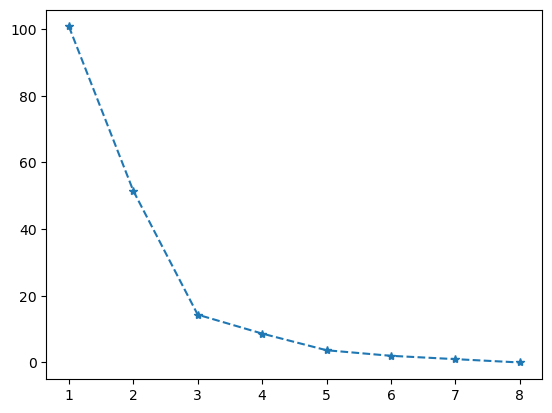

In [39]:
wcss=[]
for k in range (1,9):
    K=KMeans(n_clusters=k,random_state=42)
    K.fit(x)
    wcss.append(K.inertia_)
    
plt.plot(range(1,9),wcss,marker='*',linestyle='--')
plt.show()

In [40]:
import pandas as pd
from sklearn import datasets
from sklearn.datasets import make_blobs

In [41]:
x,y=datasets.make_blobs(n_samples=100,n_features=2,centers=None,random_state=42)

In [42]:
df=pd.DataFrame(x,columns=['x0','x1'])

In [43]:
df

,x0,x1
0,-7.726421,-8.394957
1,5.453396,0.742305
2,-2.978672,9.556846
3,6.042673,0.571319
4,-6.521840,-6.319325
...,...,...
95,-3.186120,9.625962
96,-1.478198,9.945566
97,4.478593,2.377221
98,-5.796576,-5.826308


In [44]:
df['target']=y

In [45]:
df.head()

,x0,x1,target
0,-7.726421,-8.394957,2
1,5.453396,0.742305,1
2,-2.978672,9.556846,0
3,6.042673,0.571319,1
4,-6.521840,-6.319325,2


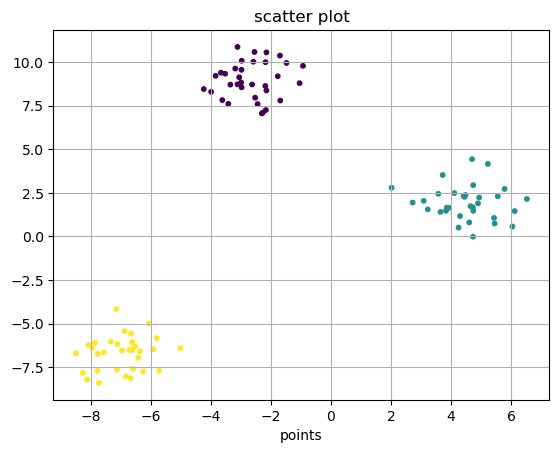

In [46]:
plt.title('scatter plot')
plt.scatter(x[:,0],x[:,1],c=y,cmap='viridis',s=10)
plt.grid()
plt.xlabel('points')
plt.ylabel('')
plt.show()

initial cluster: [[-2.58120774 10.01781903]
 [-2.14780202 10.55232269]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


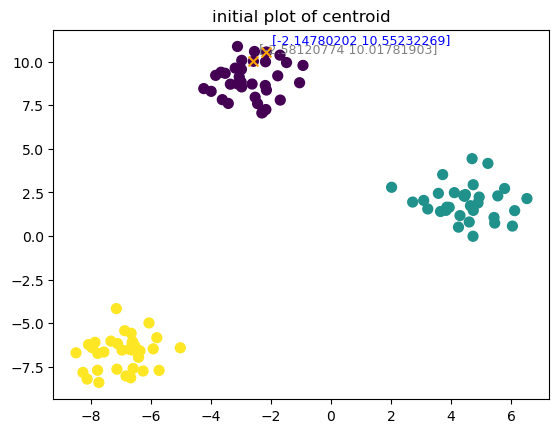

updated centroid:1 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


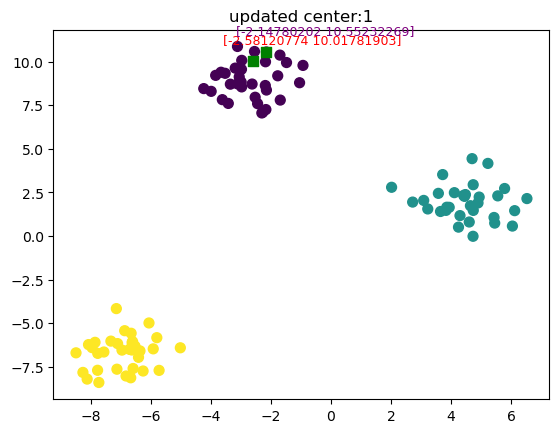

updated centroid:2 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


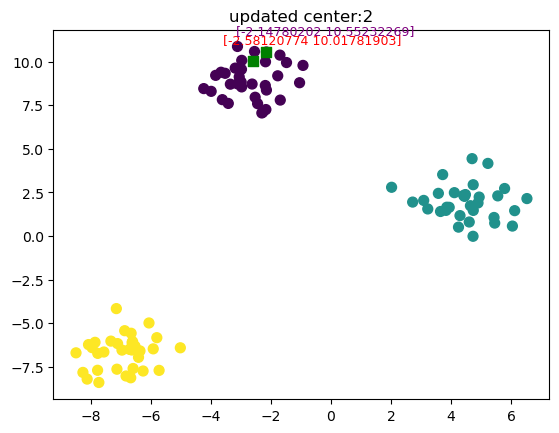

updated centroid:3 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


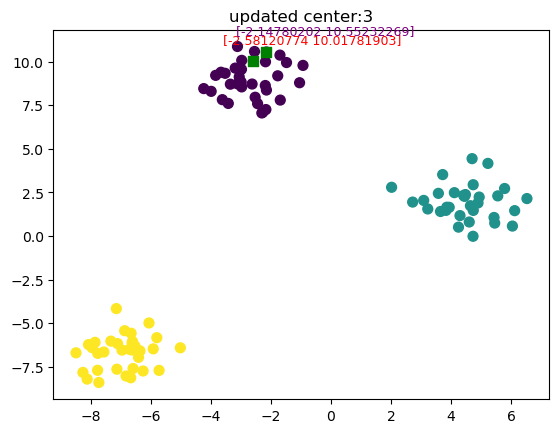

updated centroid:4 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


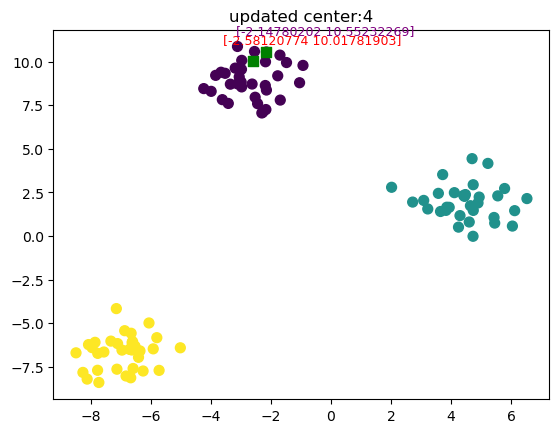

updated centroid:5 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


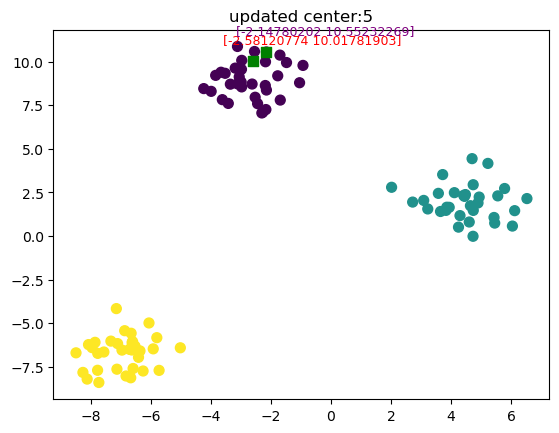

updated centroid:6 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


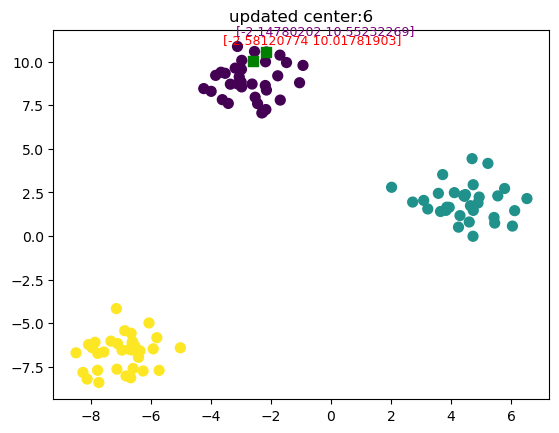

updated centroid:7 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


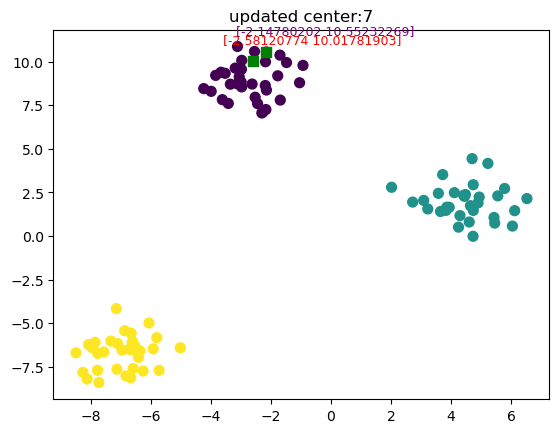

updated centroid:8 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


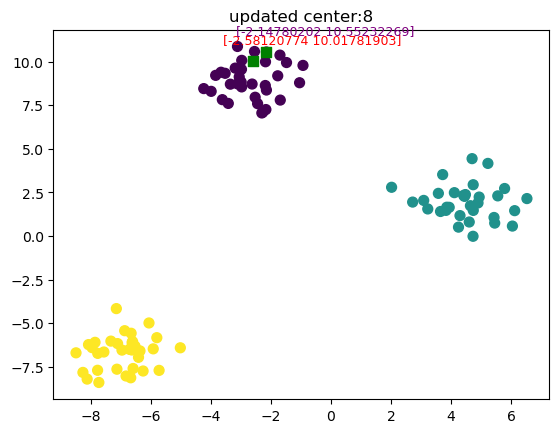

updated centroid:9 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


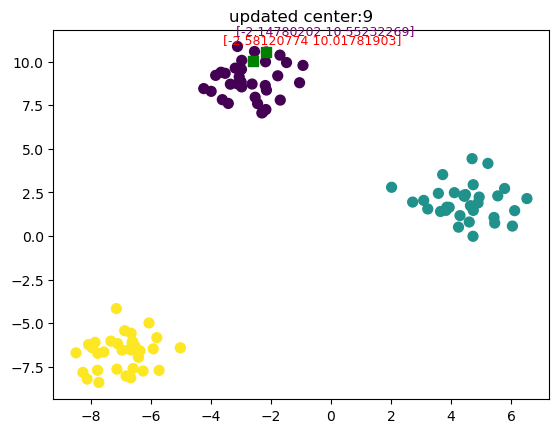

updated centroid:10 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


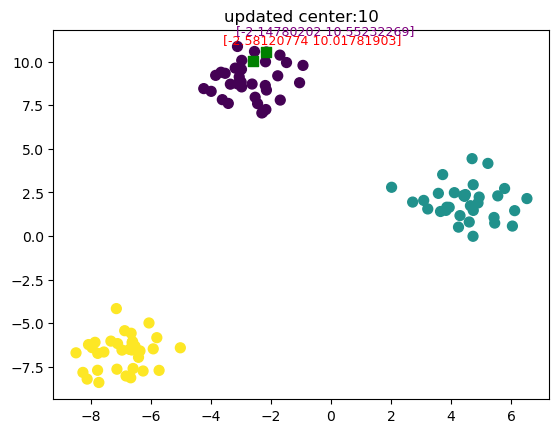

updated centroid:11 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


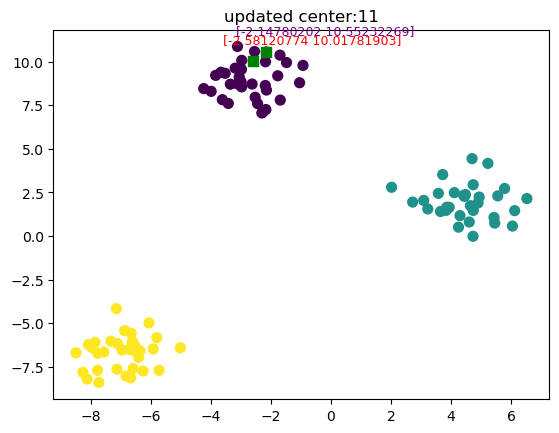

updated centroid:12 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


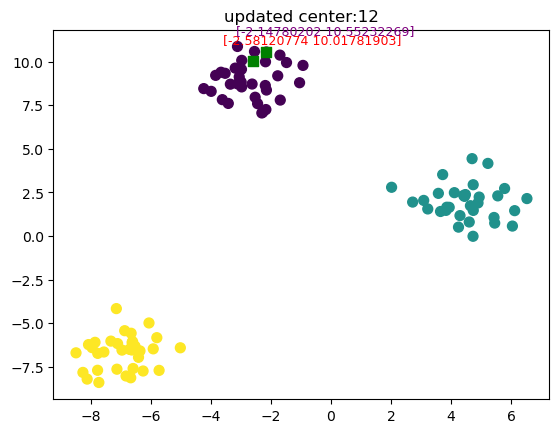

updated centroid:13 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


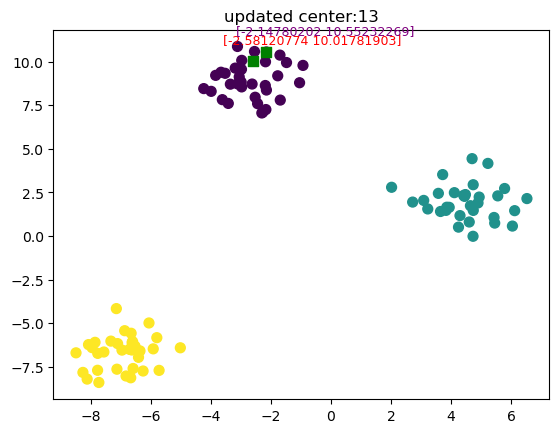

updated centroid:14 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


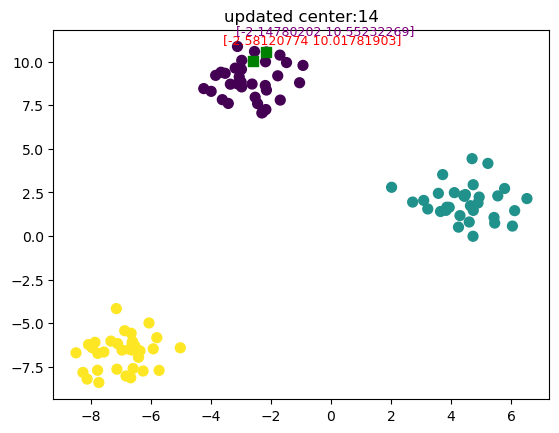

updated centroid:15 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


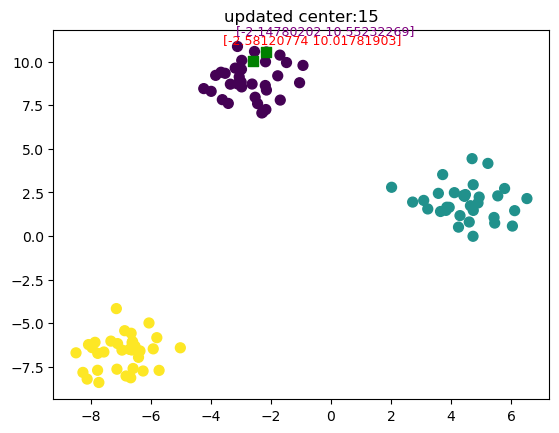

updated centroid:16 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


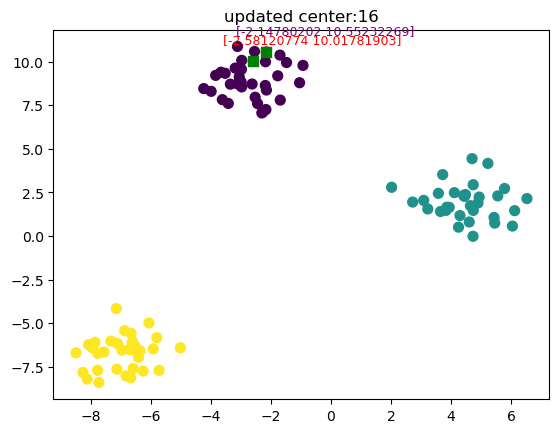

updated centroid:17 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


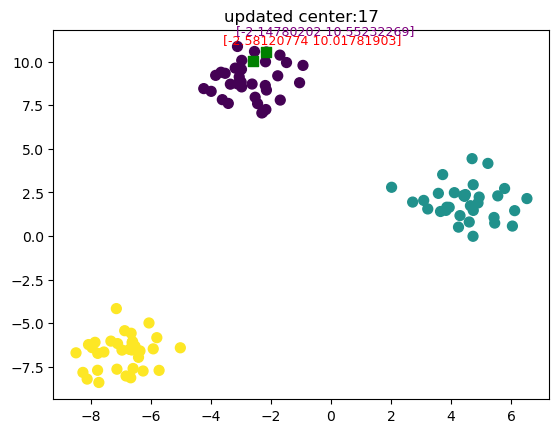

updated centroid:18 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


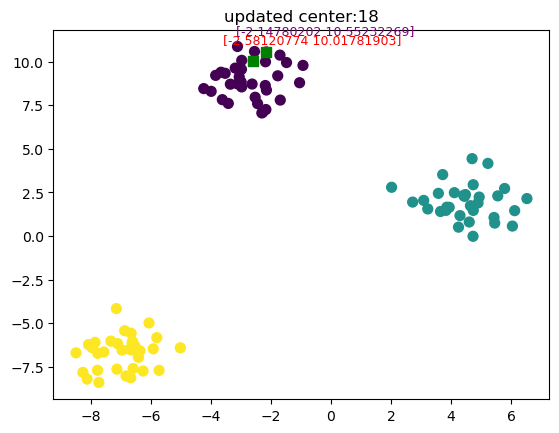

updated centroid:19 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


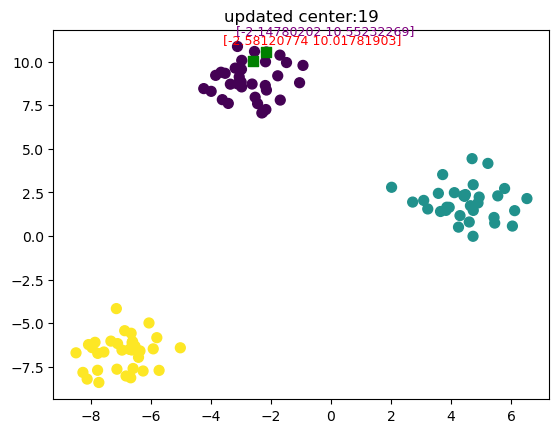

updated centroid:20 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


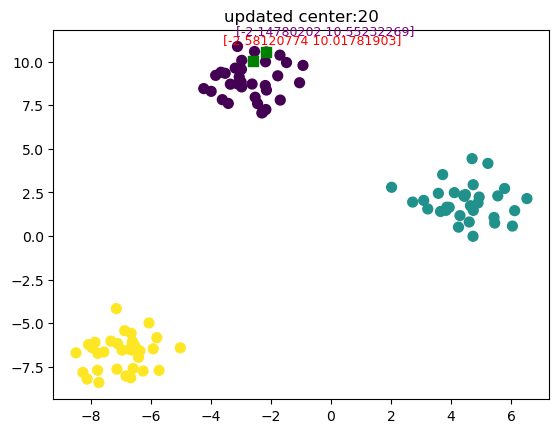

updated centroid:21 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


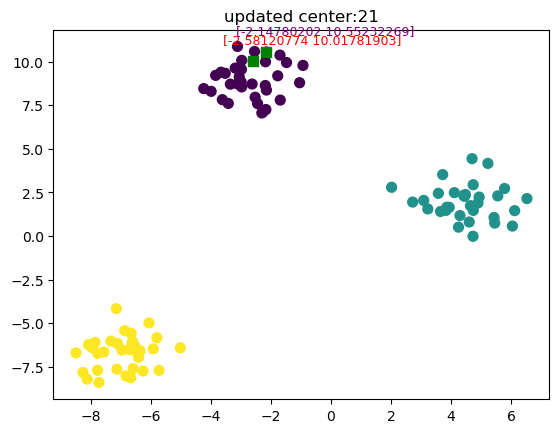

updated centroid:22 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


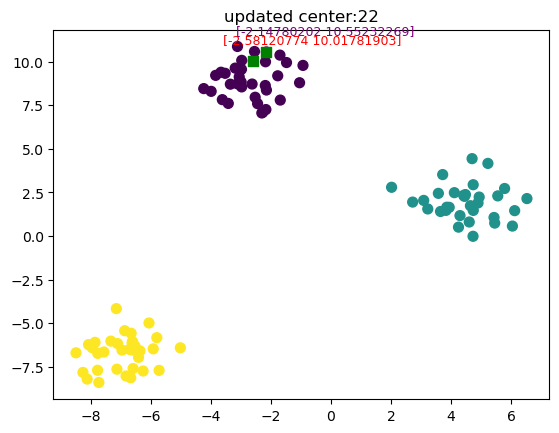

updated centroid:23 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


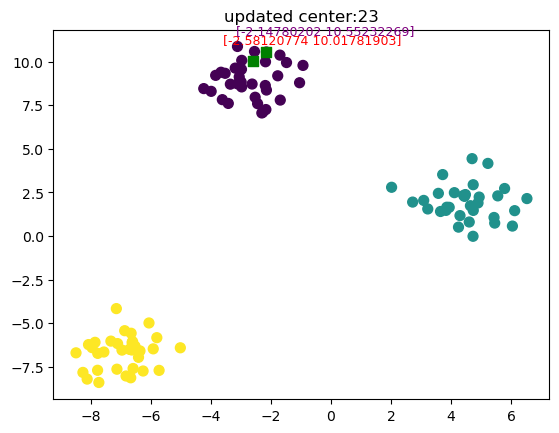

updated centroid:24 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


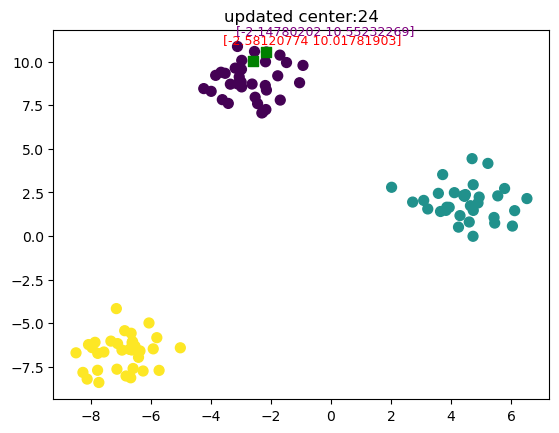

updated centroid:25 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


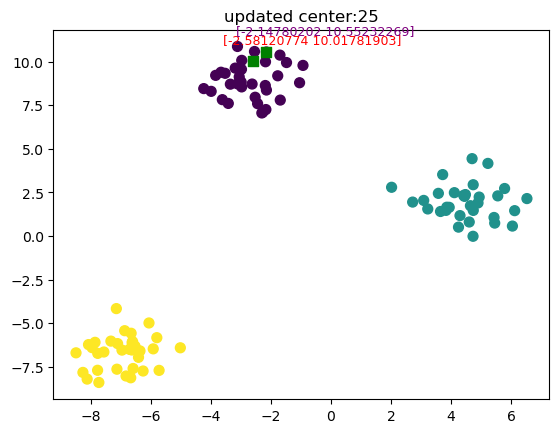

updated centroid:26 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


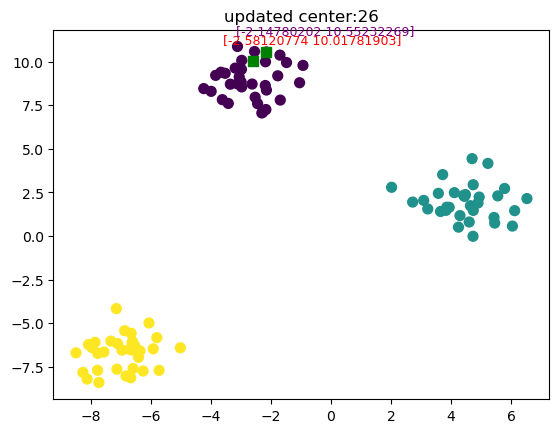

updated centroid:27 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


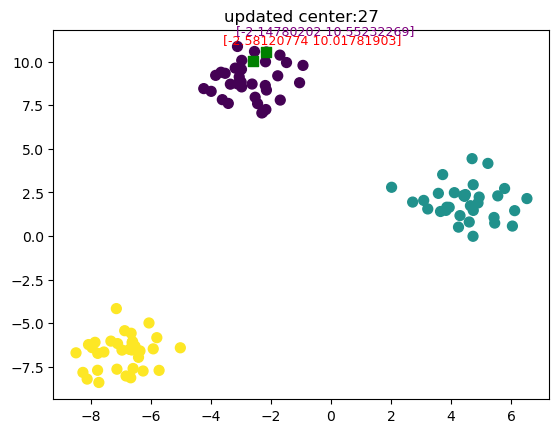

updated centroid:28 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


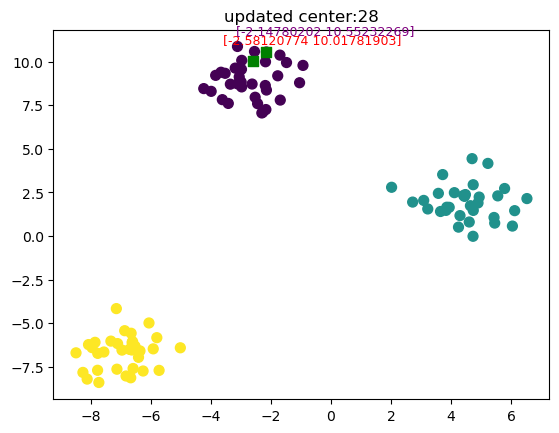

updated centroid:29 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


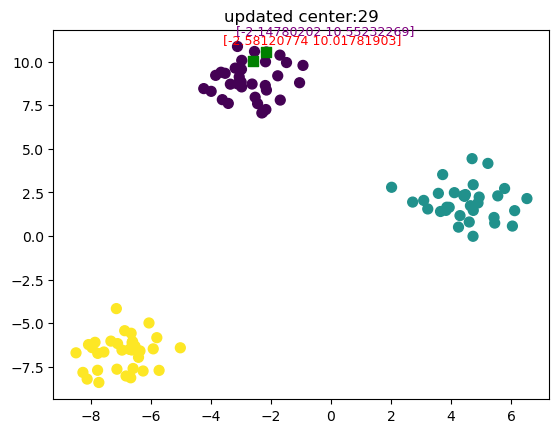

updated centroid:30 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


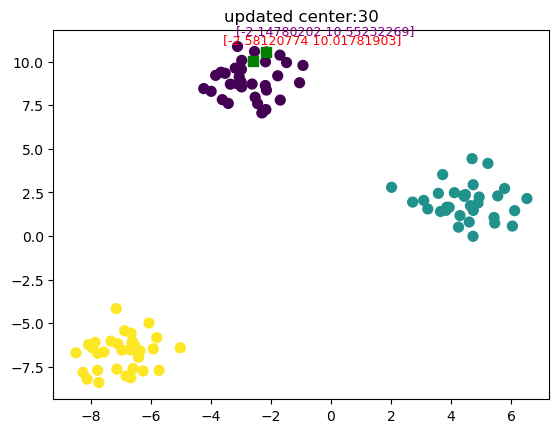

updated centroid:31 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


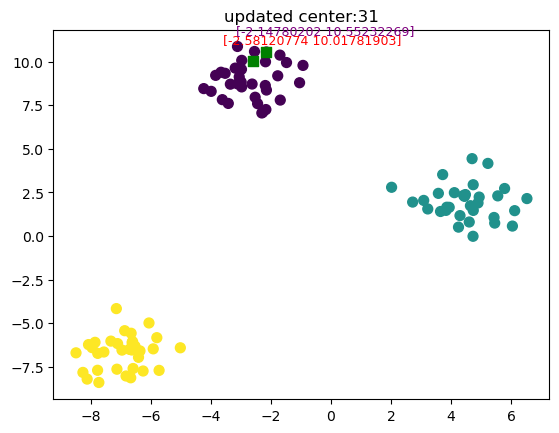

updated centroid:32 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


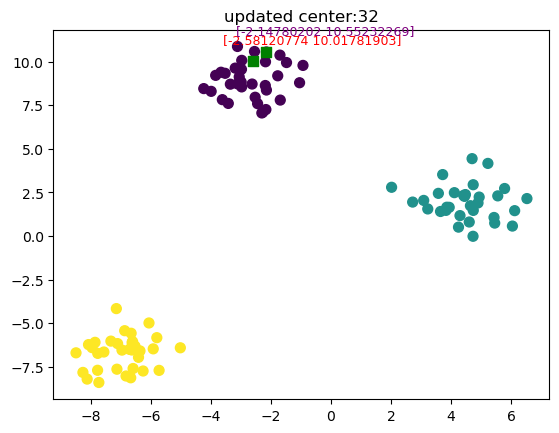

updated centroid:33 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


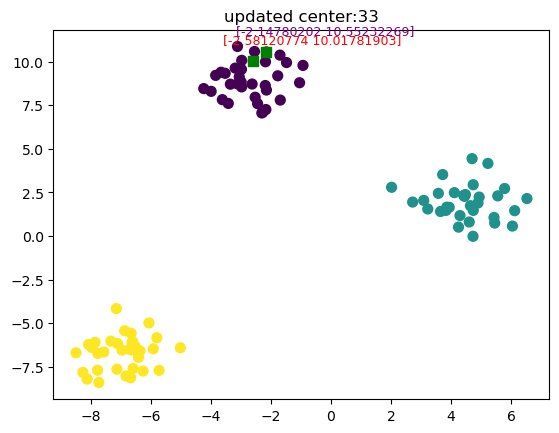

updated centroid:34 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


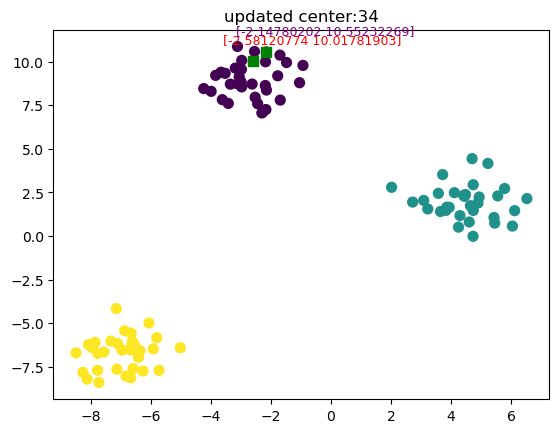

updated centroid:35 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


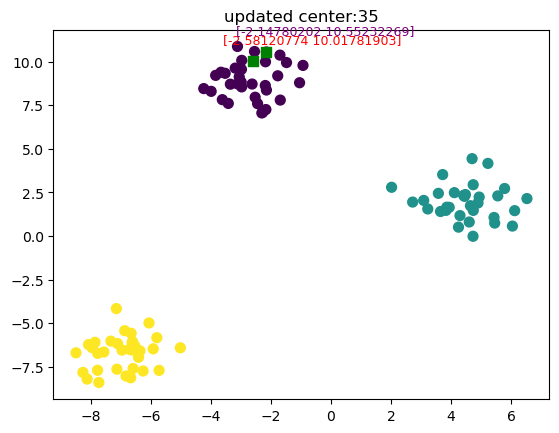

updated centroid:36 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


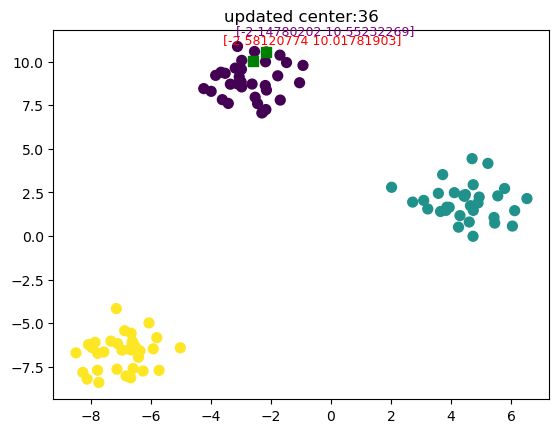

updated centroid:37 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


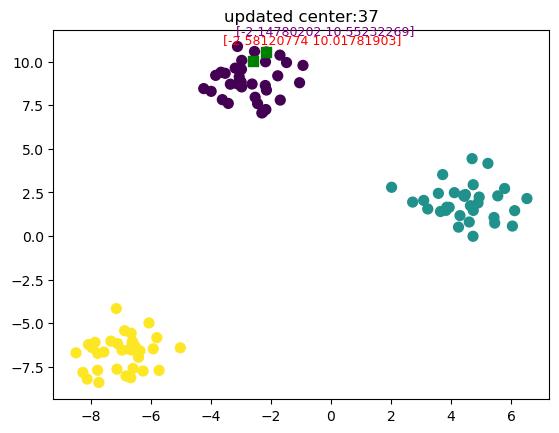

updated centroid:38 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


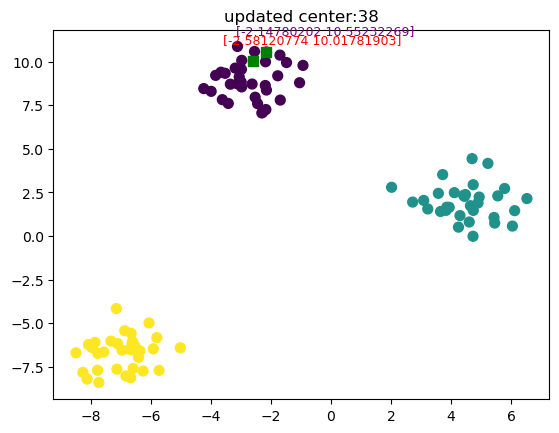

updated centroid:39 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


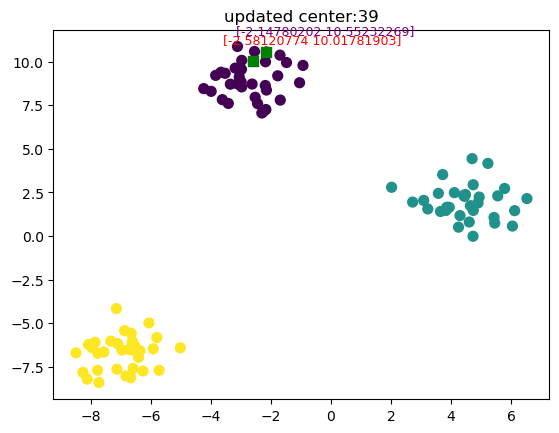

updated centroid:40 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


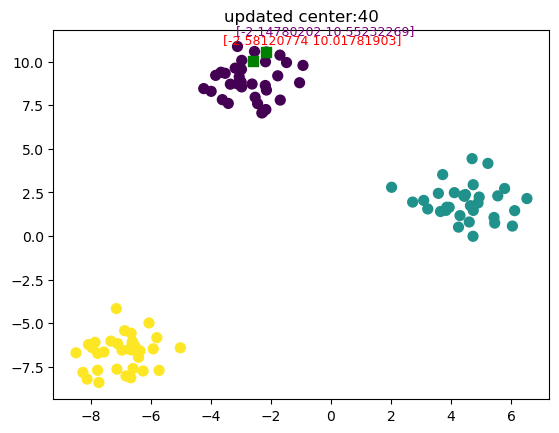

updated centroid:41 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


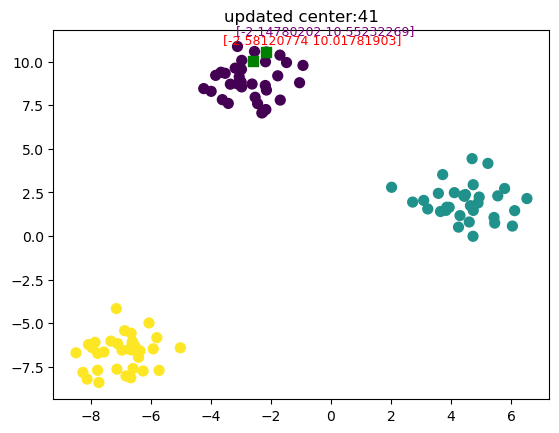

updated centroid:42 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


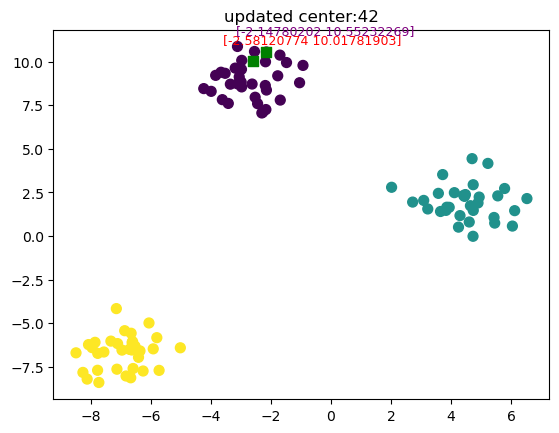

updated centroid:43 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


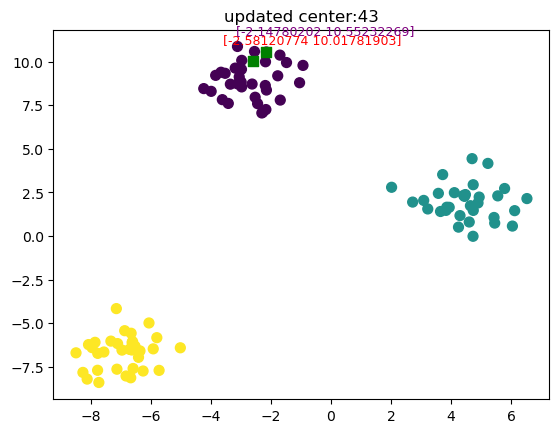

updated centroid:44 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


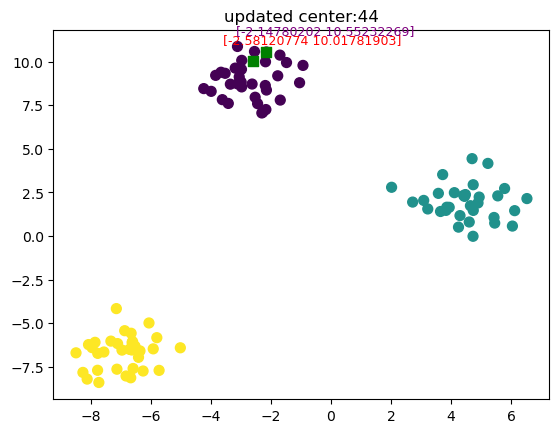

updated centroid:45 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


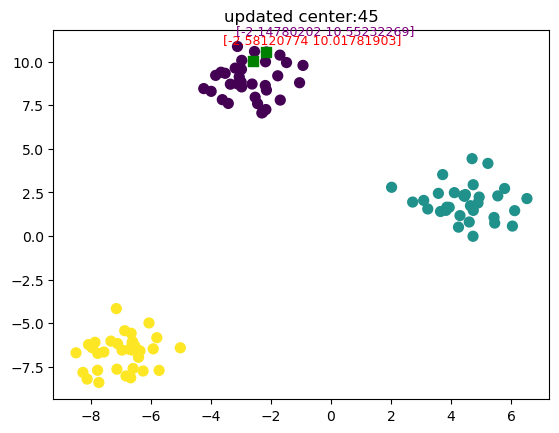

updated centroid:46 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


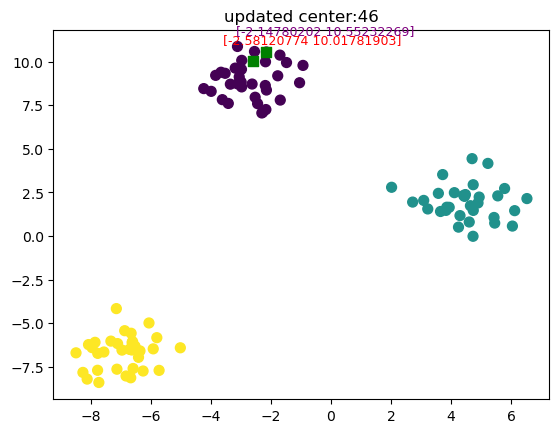

updated centroid:47 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


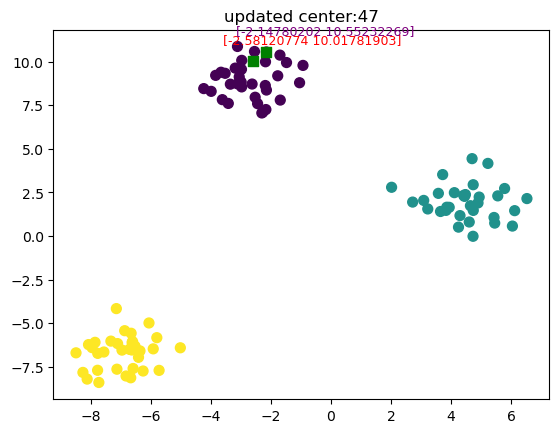

updated centroid:48 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


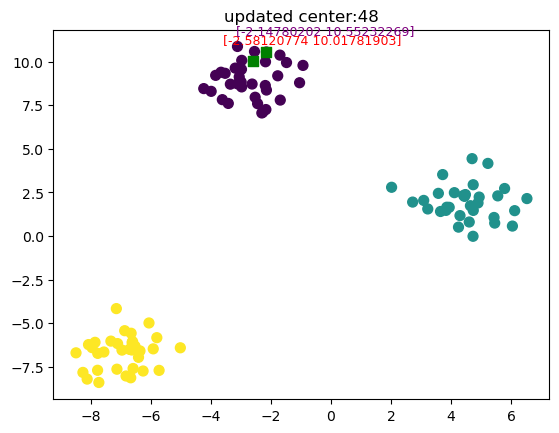

updated centroid:49 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


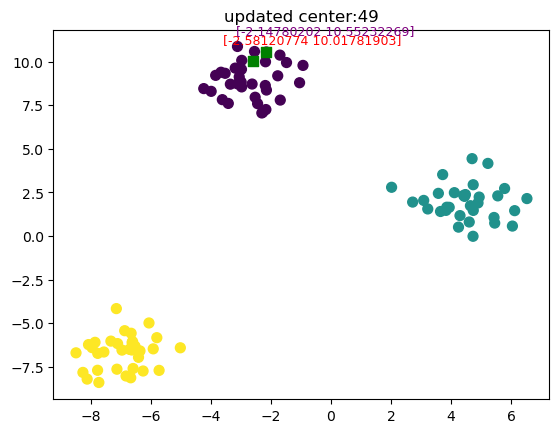

updated centroid:50 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


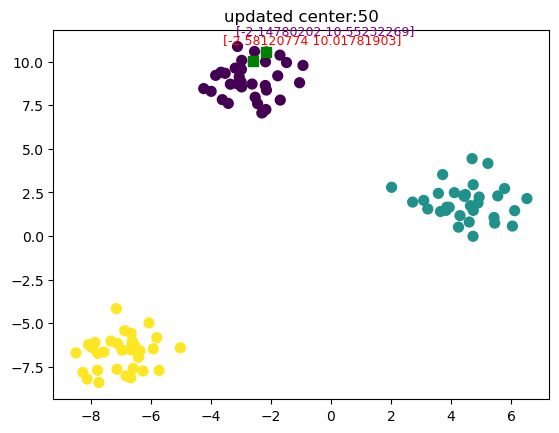

updated centroid:51 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


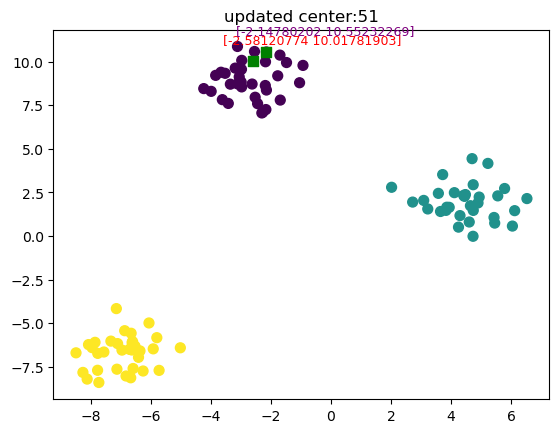

updated centroid:52 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


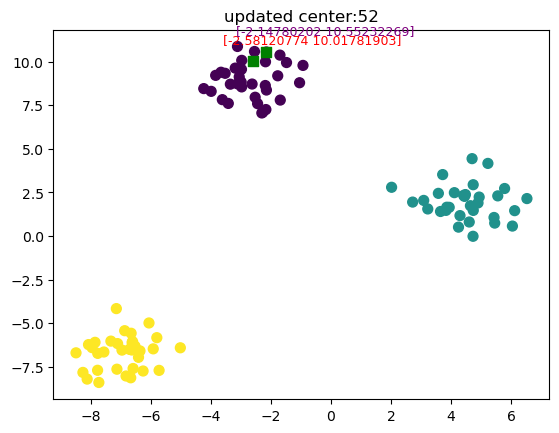

updated centroid:53 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


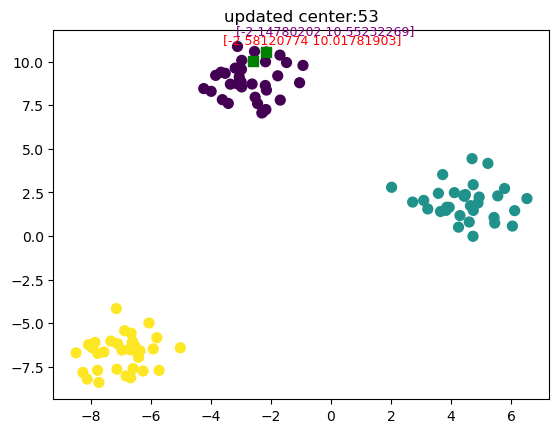

updated centroid:54 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


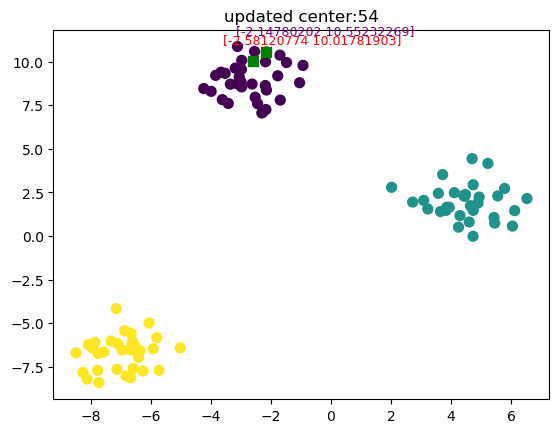

updated centroid:55 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


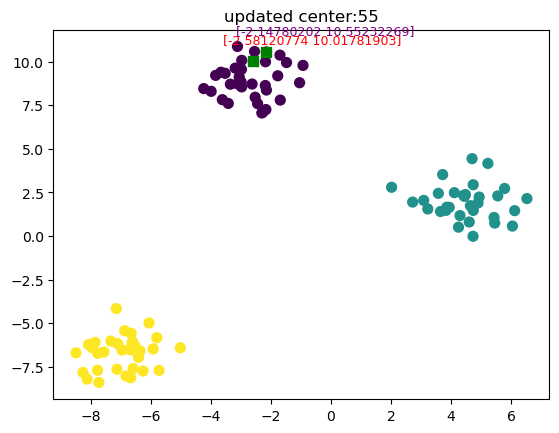

updated centroid:56 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


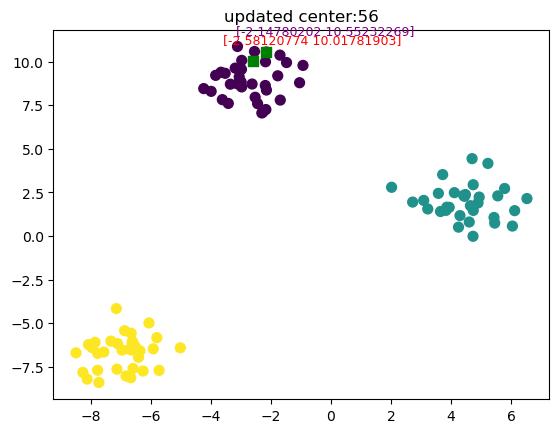

updated centroid:57 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


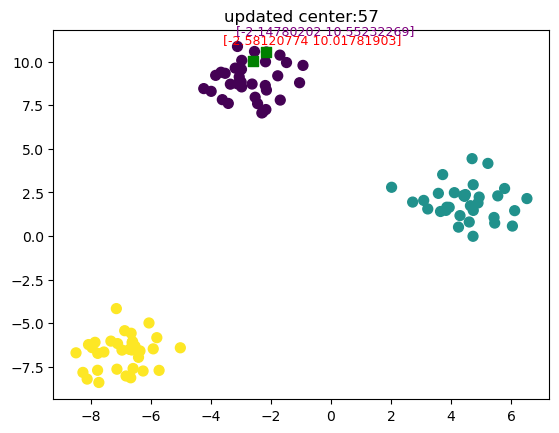

updated centroid:58 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


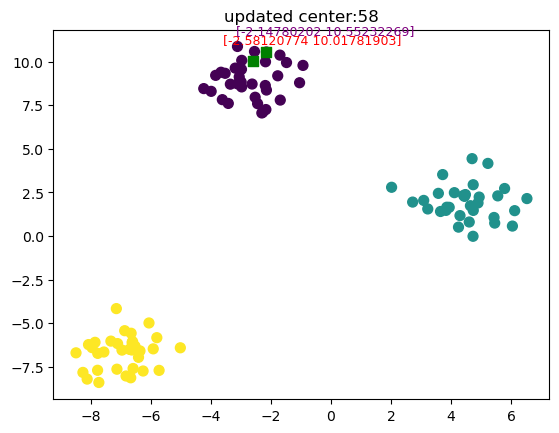

updated centroid:59 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


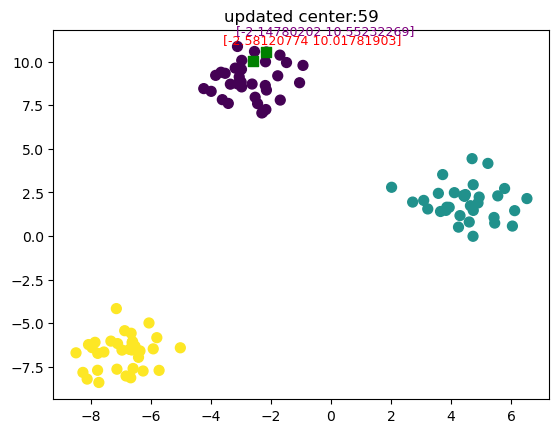

updated centroid:60 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


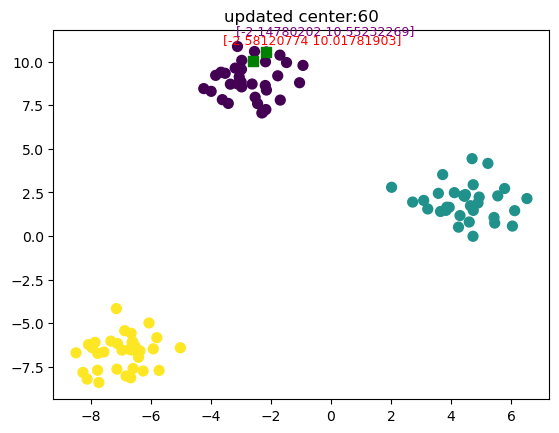

updated centroid:61 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


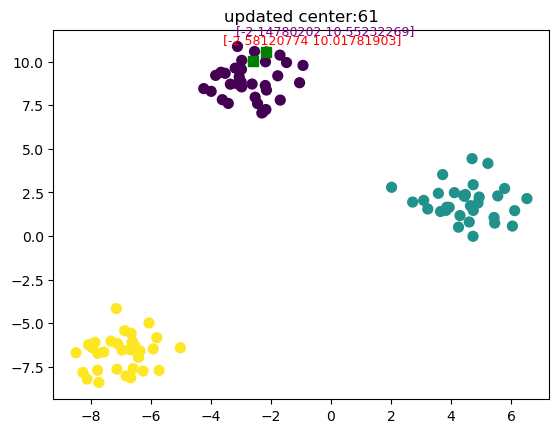

updated centroid:62 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


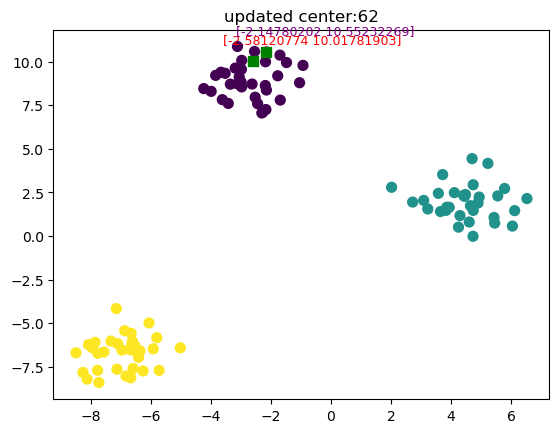

updated centroid:63 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


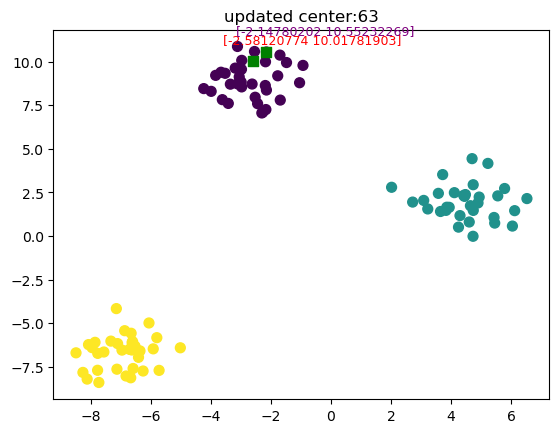

updated centroid:64 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


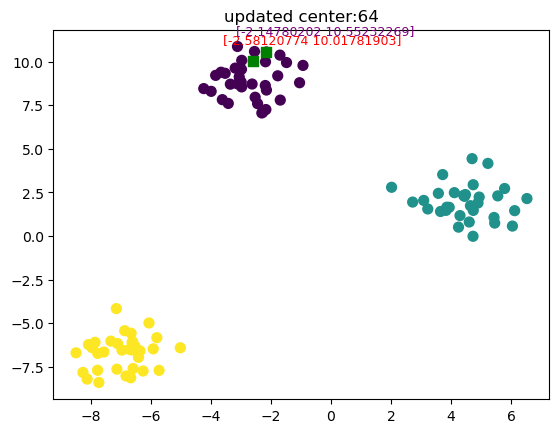

updated centroid:65 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


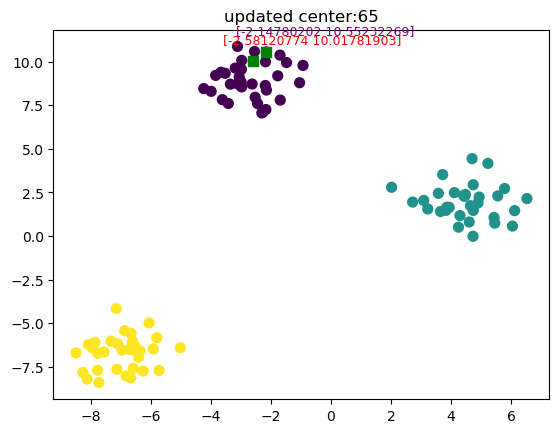

updated centroid:66 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


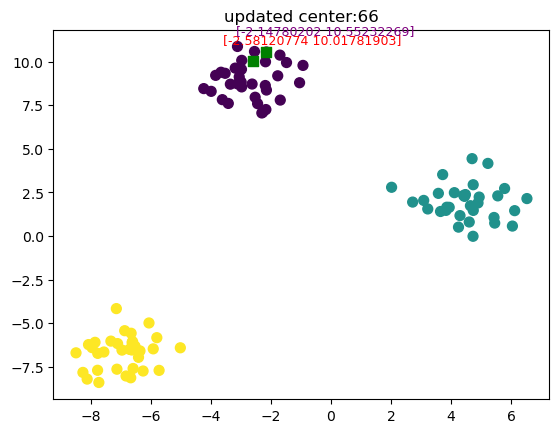

updated centroid:67 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


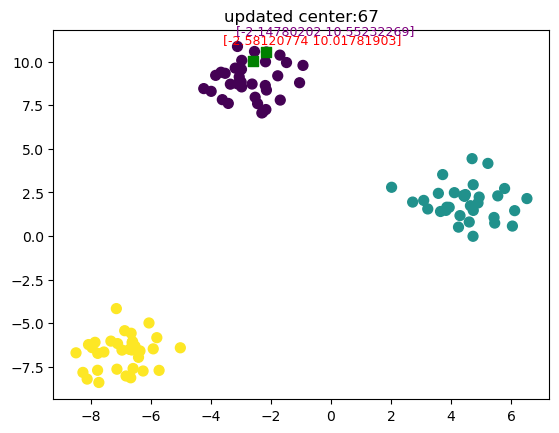

updated centroid:68 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


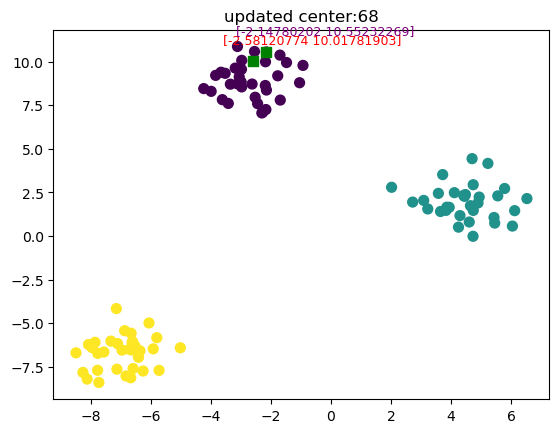

updated centroid:69 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


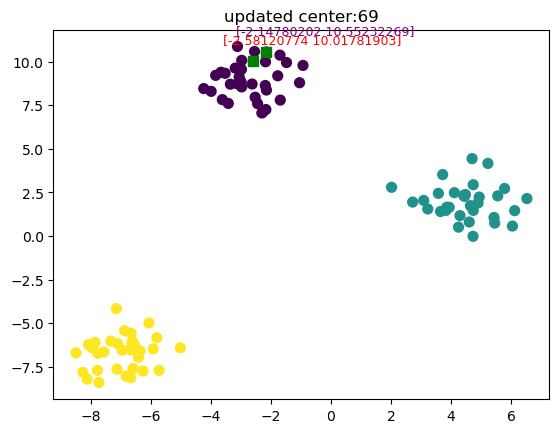

updated centroid:70 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


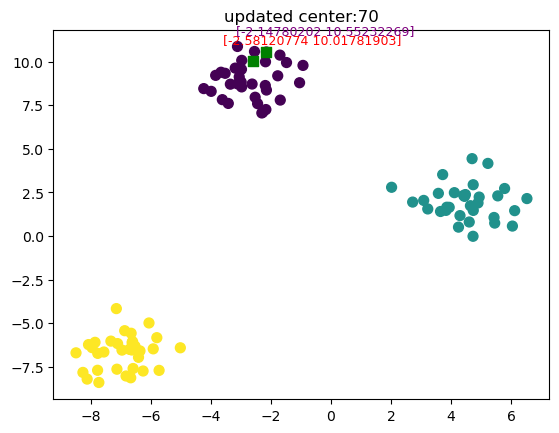

updated centroid:71 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


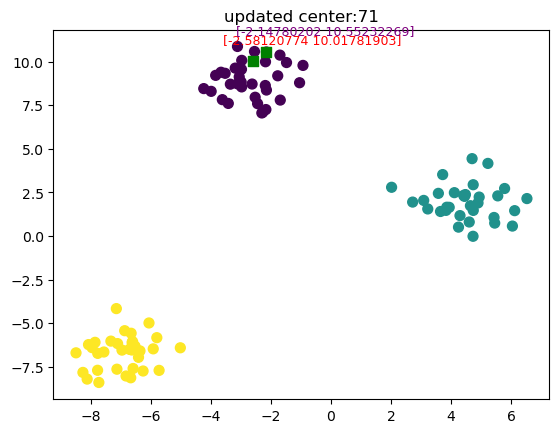

updated centroid:72 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


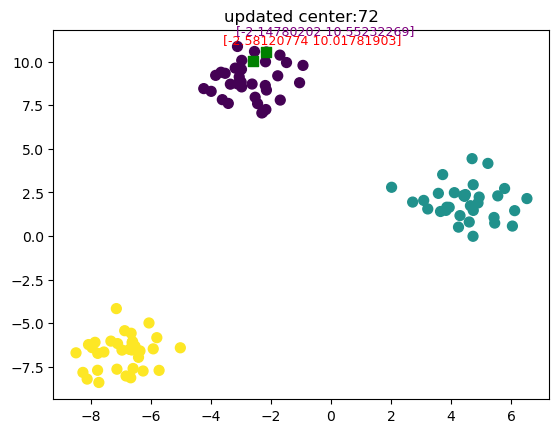

updated centroid:73 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


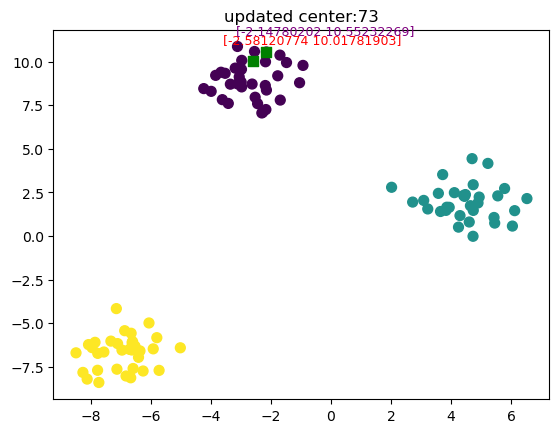

updated centroid:74 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


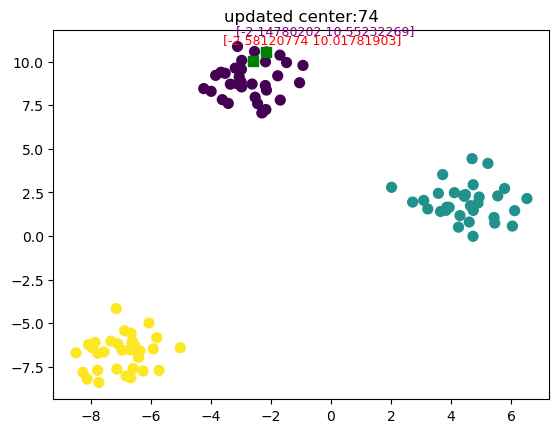

updated centroid:75 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


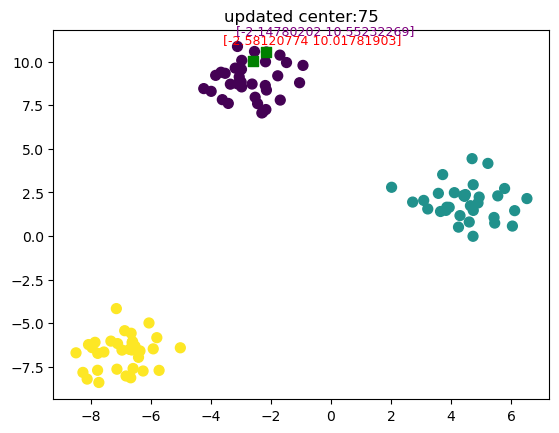

updated centroid:76 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


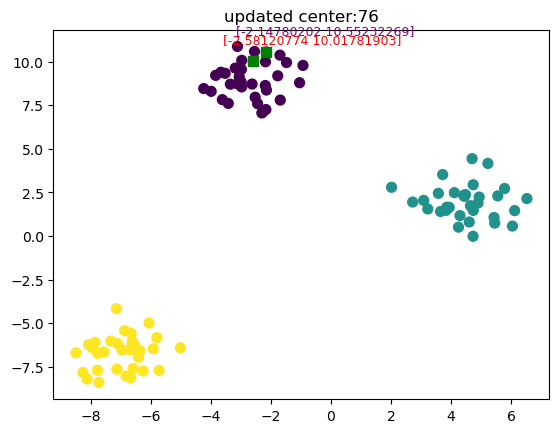

updated centroid:77 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


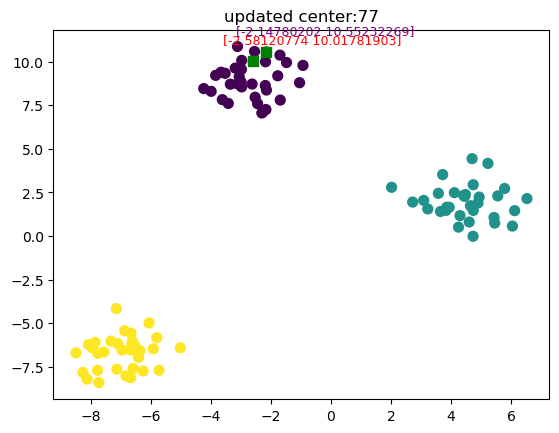

updated centroid:78 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


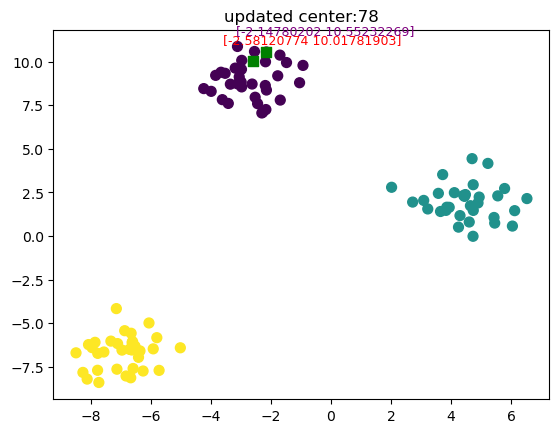

updated centroid:79 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


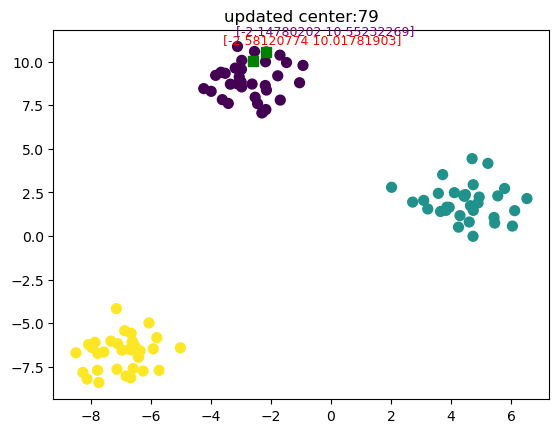

updated centroid:80 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


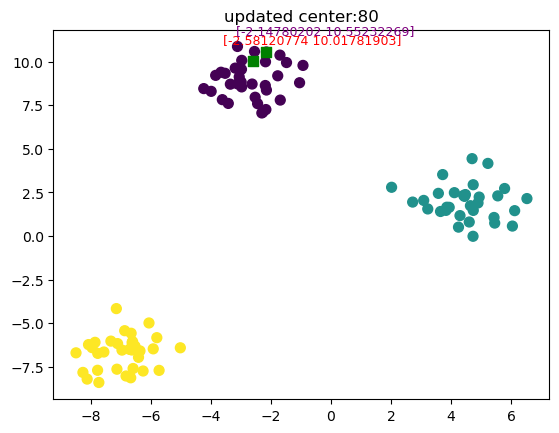

updated centroid:81 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


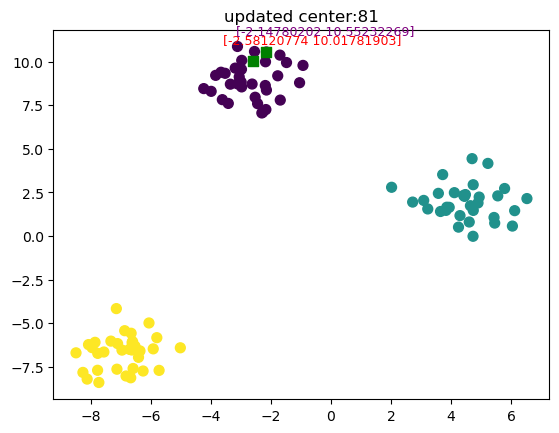

updated centroid:82 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


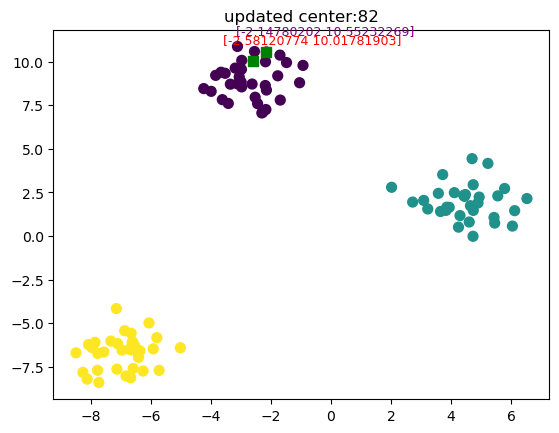

updated centroid:83 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


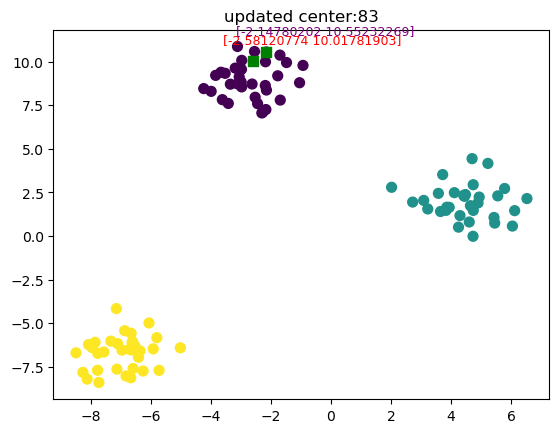

updated centroid:84 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


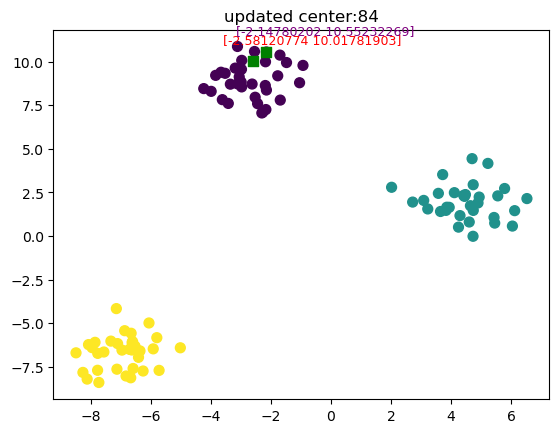

updated centroid:85 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


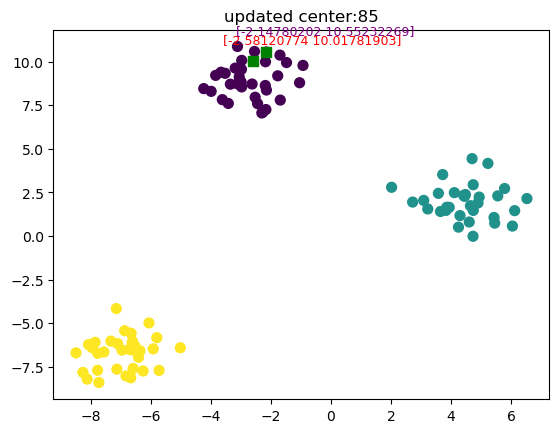

updated centroid:86 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


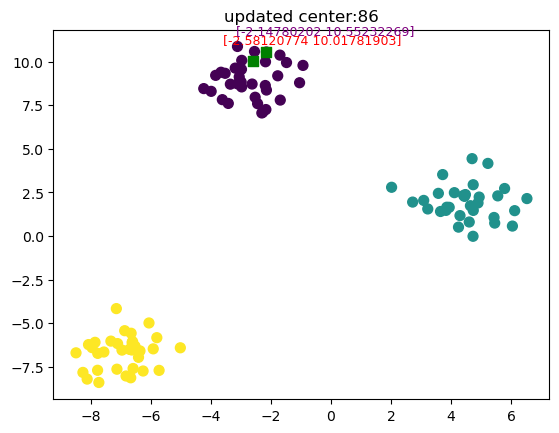

updated centroid:87 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


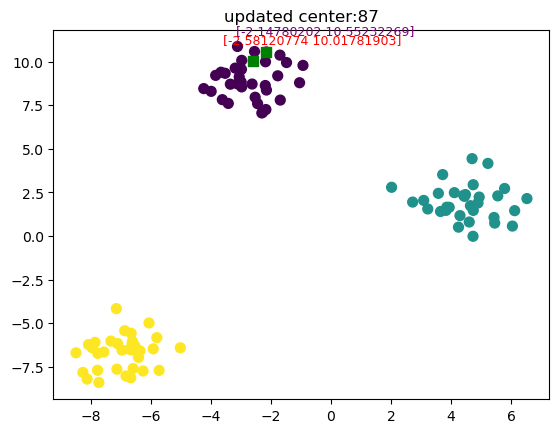

updated centroid:88 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


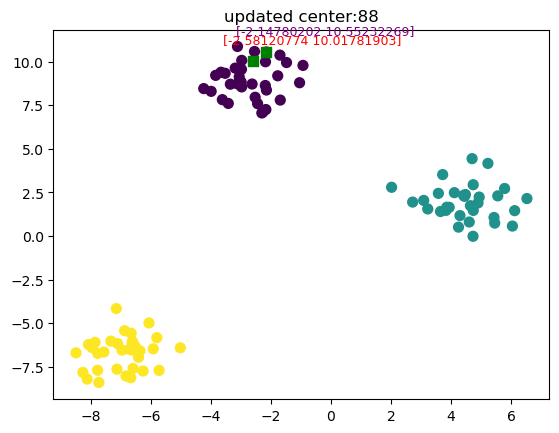

updated centroid:89 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


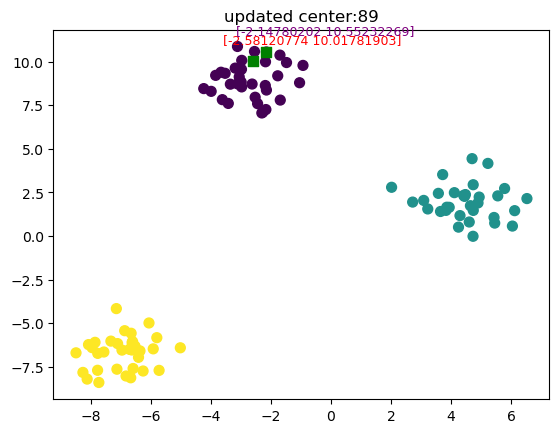

updated centroid:90 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


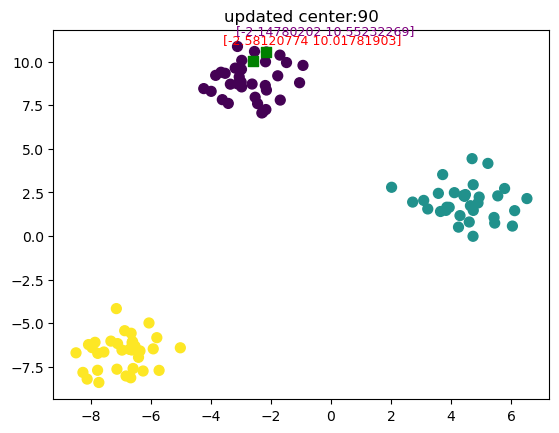

updated centroid:91 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


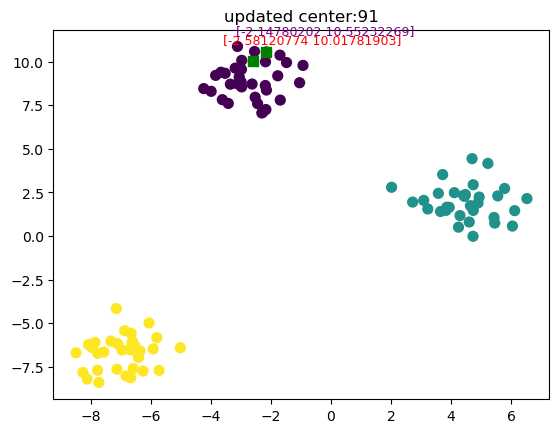

updated centroid:92 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


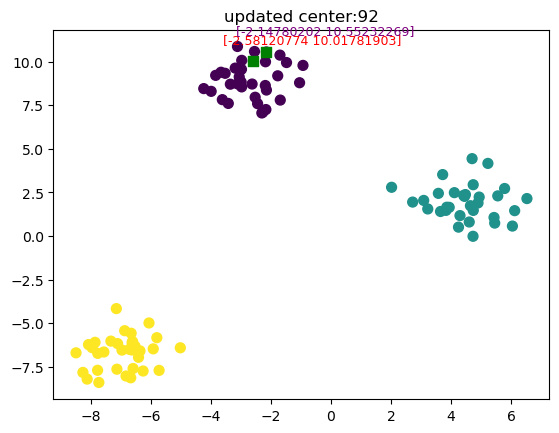

updated centroid:93 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


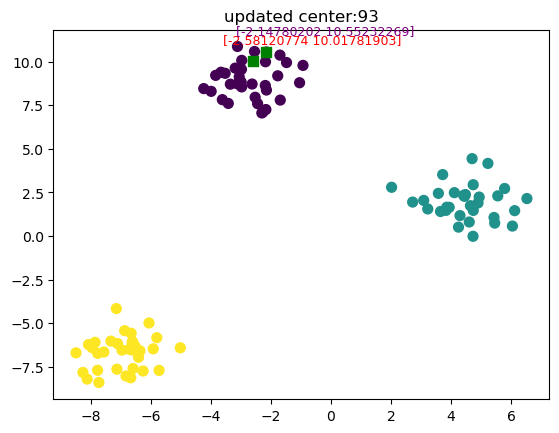

updated centroid:94 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


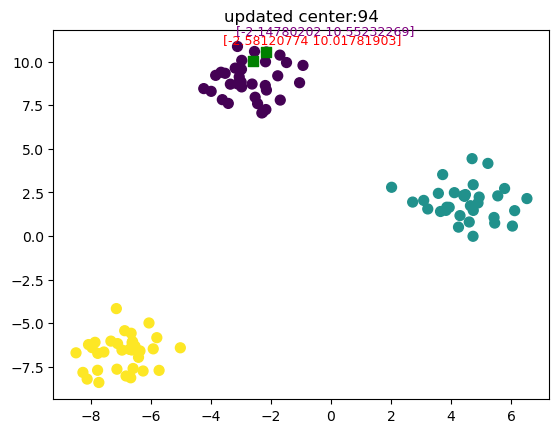

updated centroid:95 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


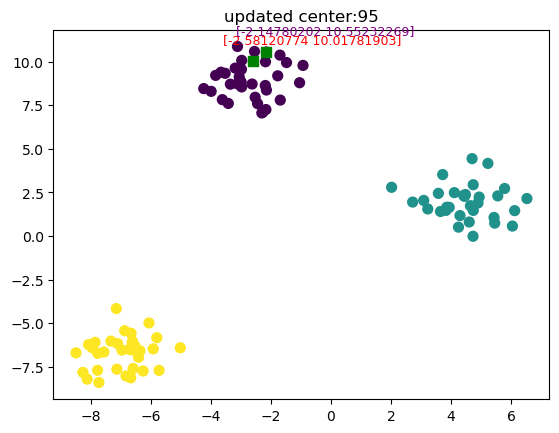

updated centroid:96 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


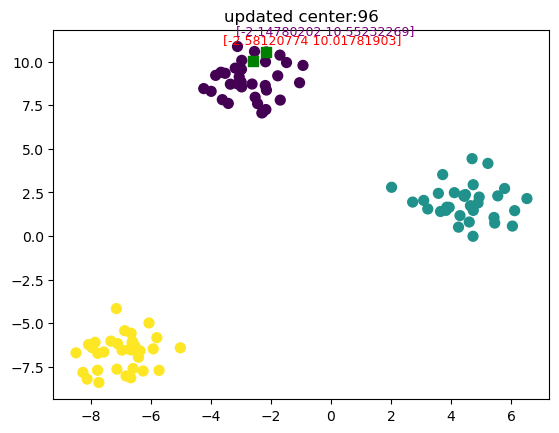

updated centroid:97 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


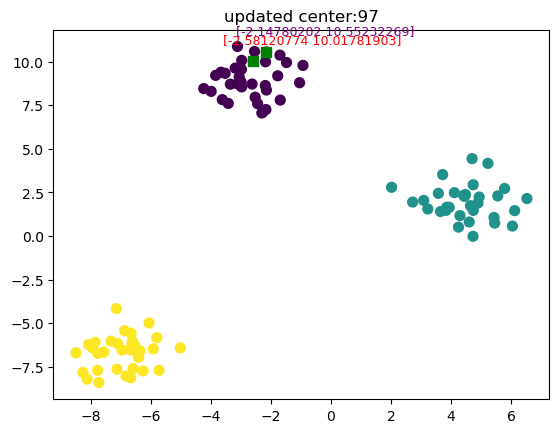

updated centroid:98 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


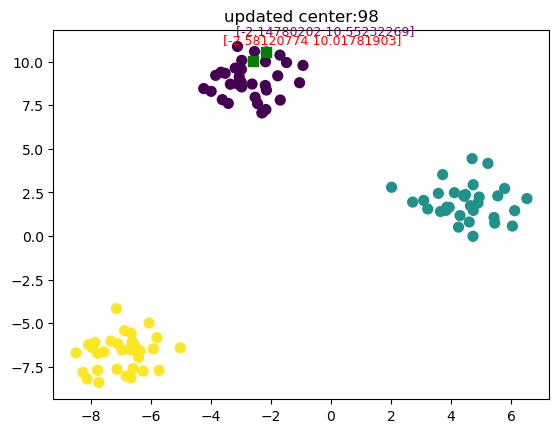

updated centroid:99 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


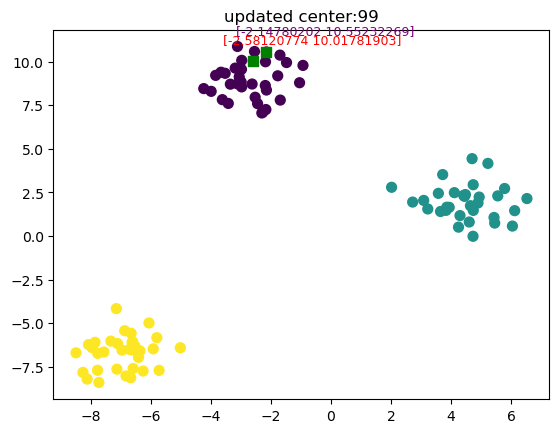

updated centroid:100 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


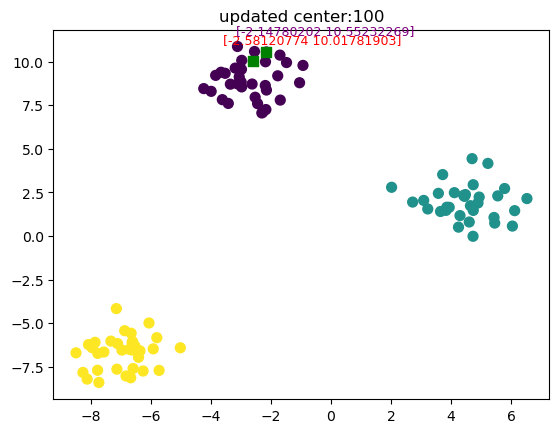

updated centroid:101 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


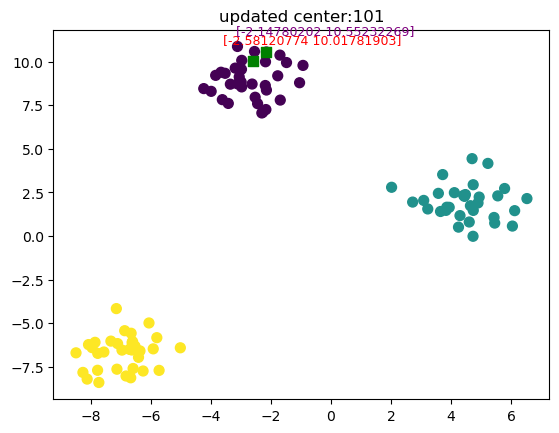

updated centroid:102 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


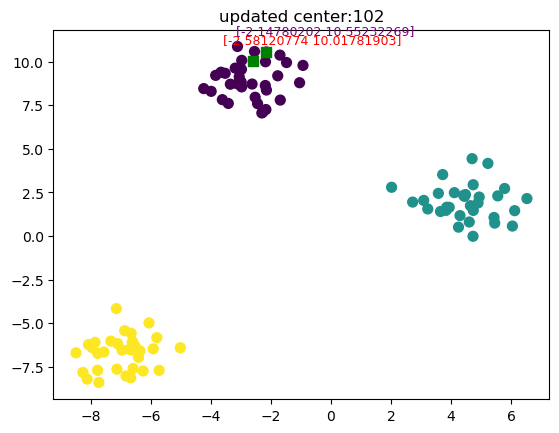

updated centroid:103 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


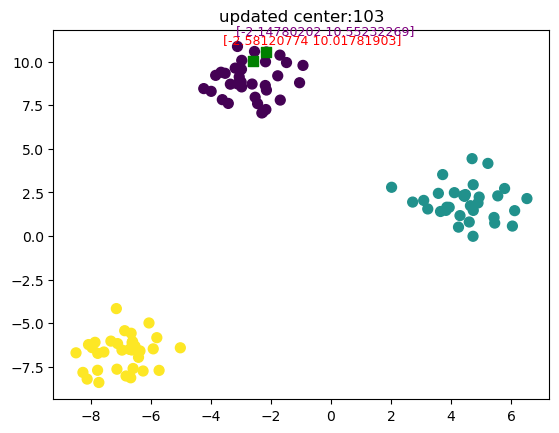

updated centroid:104 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


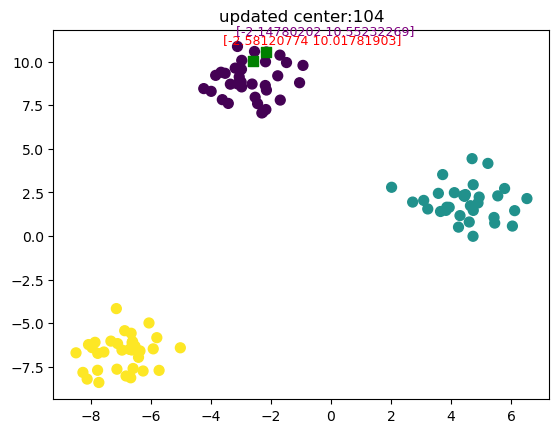

updated centroid:105 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


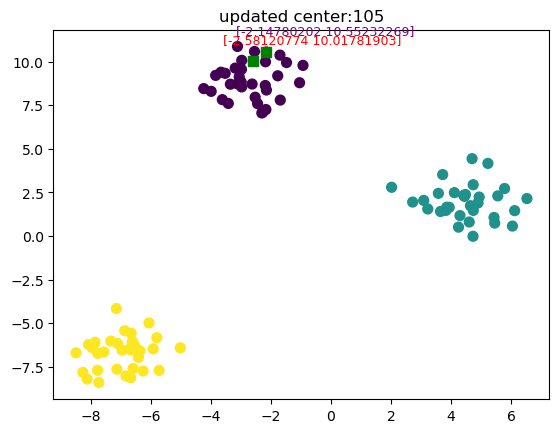

updated centroid:106 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


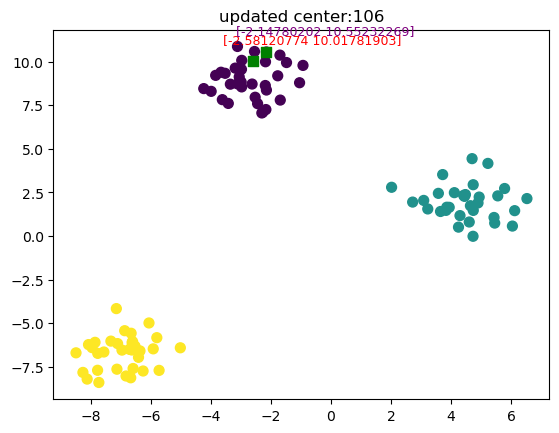

updated centroid:107 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


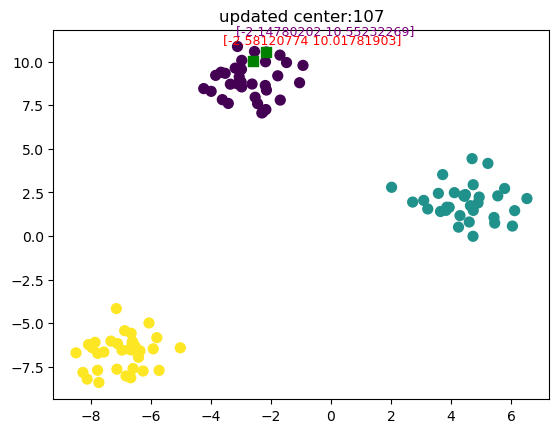

updated centroid:108 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


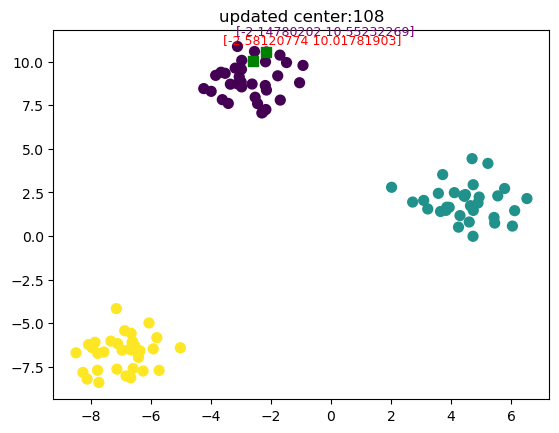

updated centroid:109 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


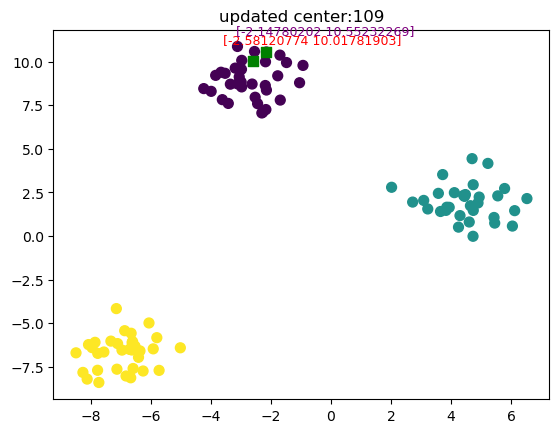

updated centroid:110 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


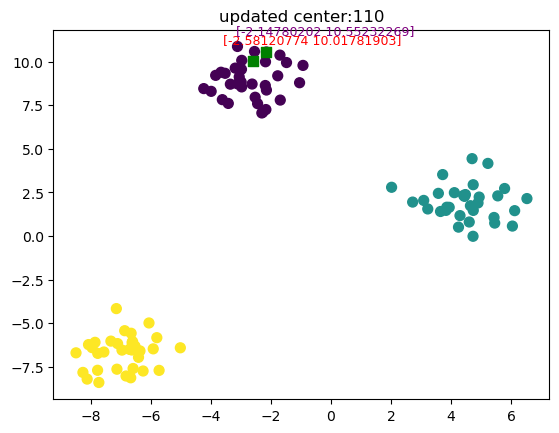

updated centroid:111 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


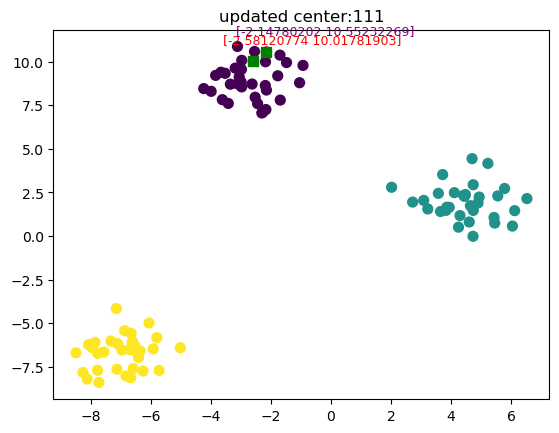

updated centroid:112 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


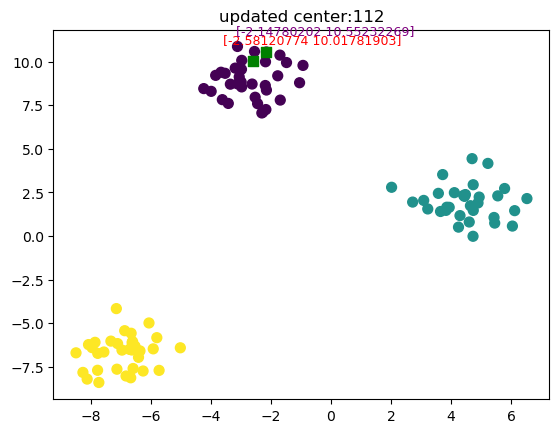

updated centroid:113 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


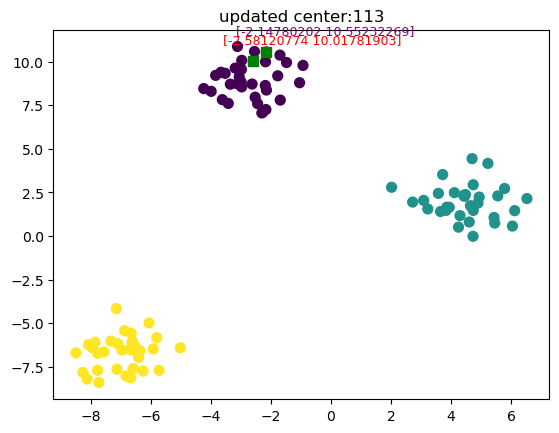

updated centroid:114 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


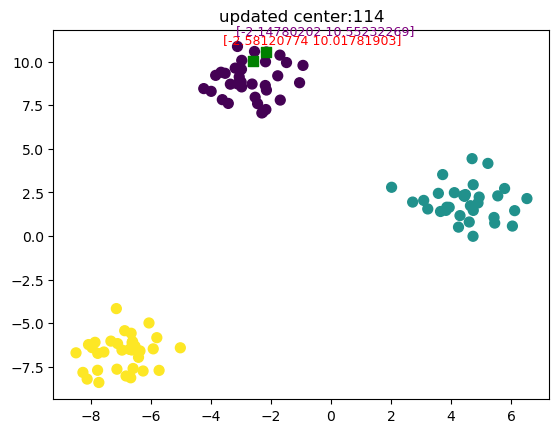

updated centroid:115 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


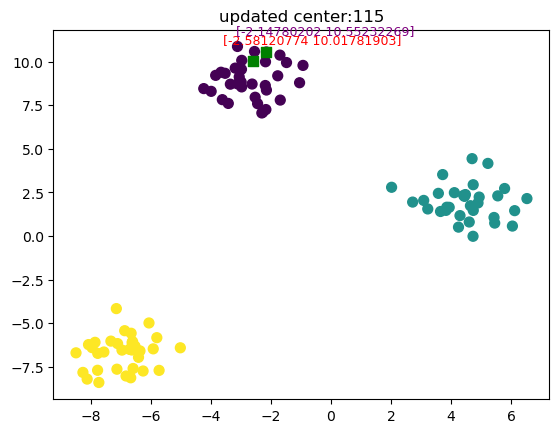

updated centroid:116 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


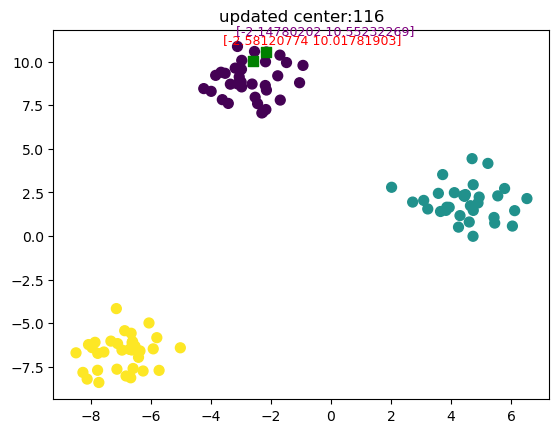

updated centroid:117 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


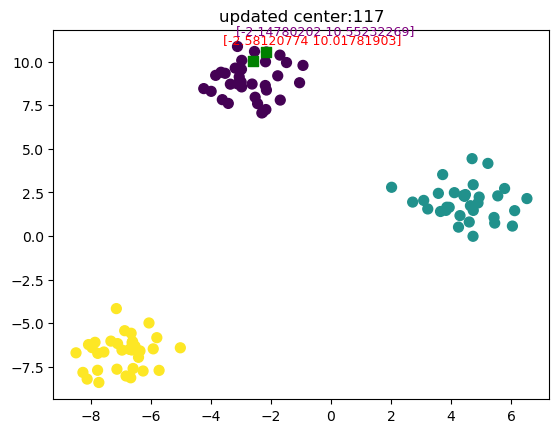

updated centroid:118 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


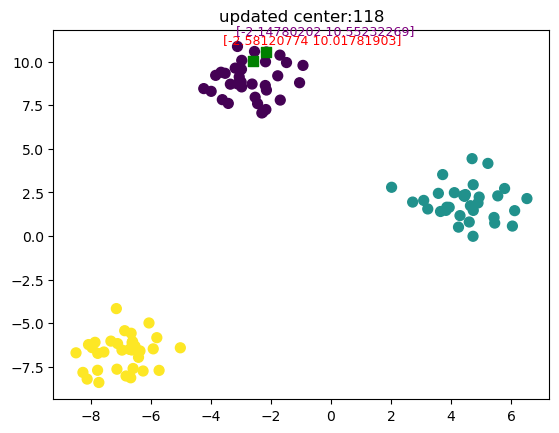

updated centroid:119 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


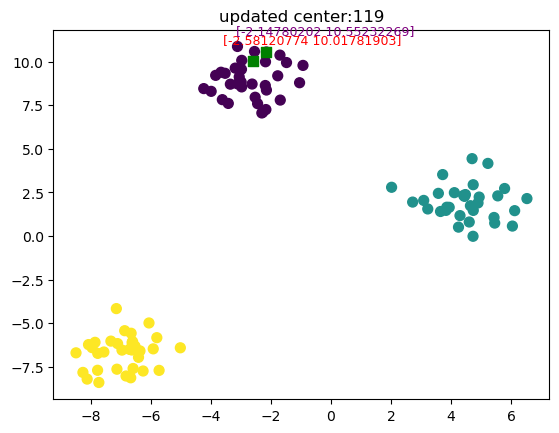

updated centroid:120 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


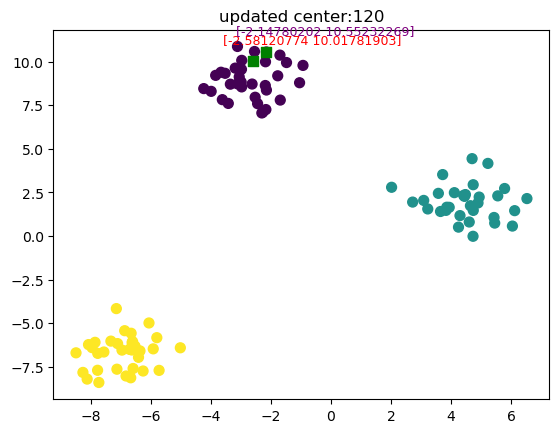

updated centroid:121 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


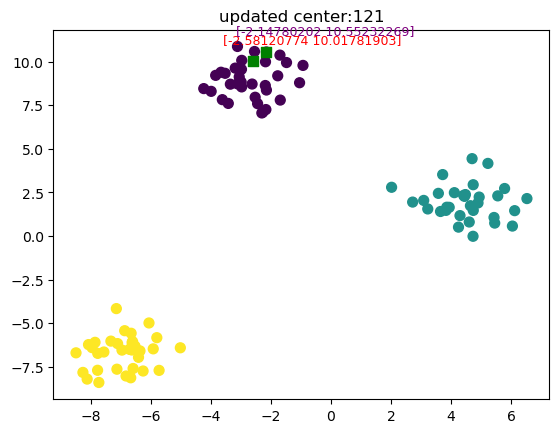

updated centroid:122 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


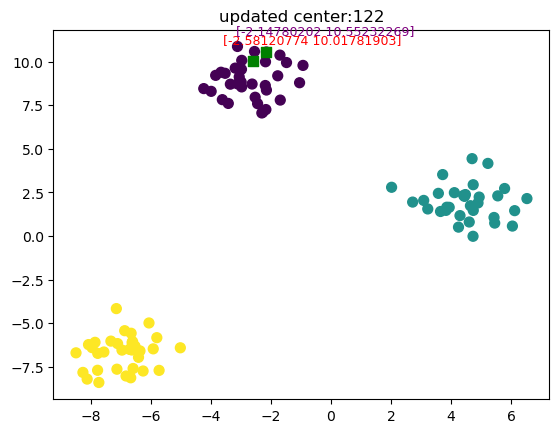

updated centroid:123 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


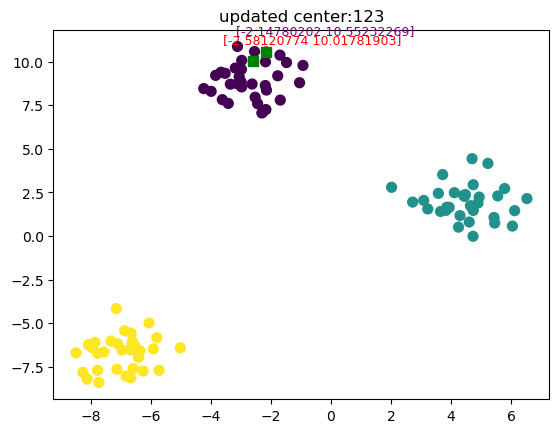

updated centroid:124 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


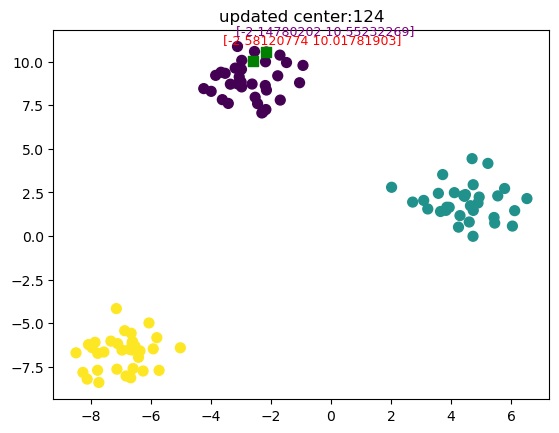

updated centroid:125 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


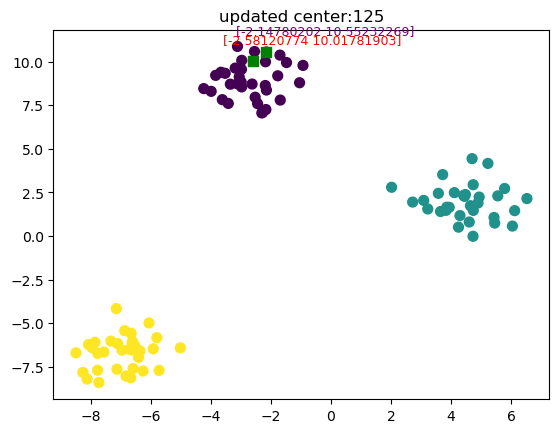

updated centroid:126 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


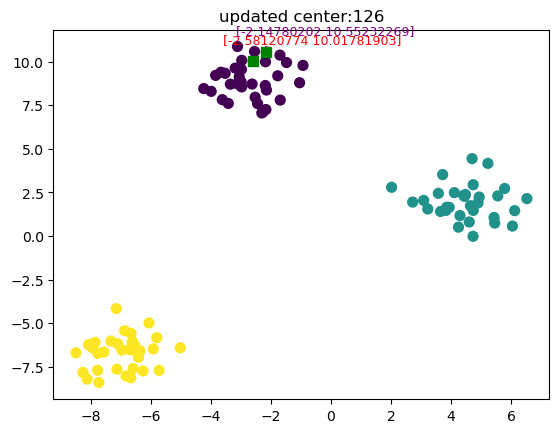

updated centroid:127 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


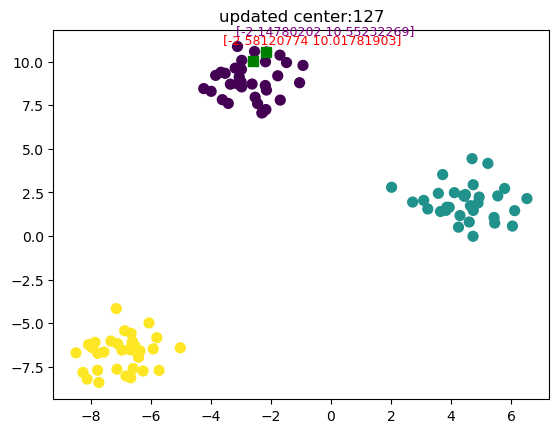

updated centroid:128 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


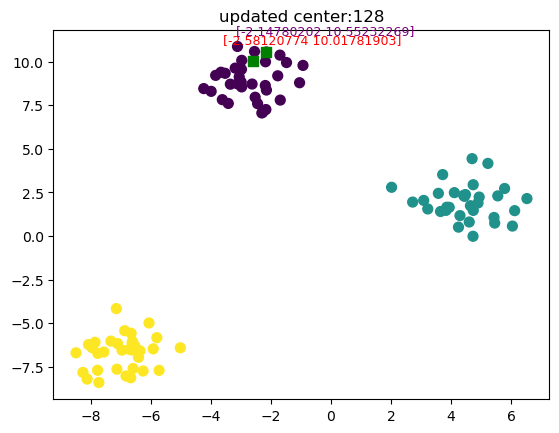

updated centroid:129 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


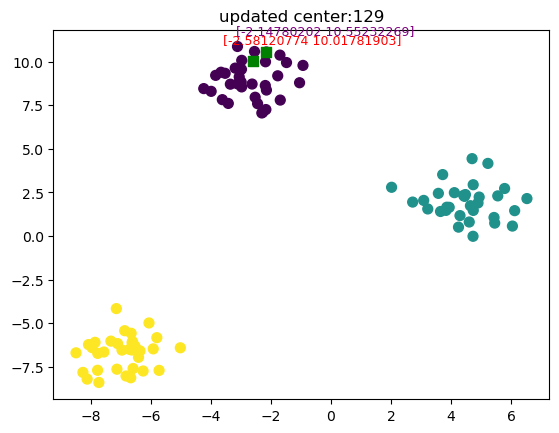

updated centroid:130 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


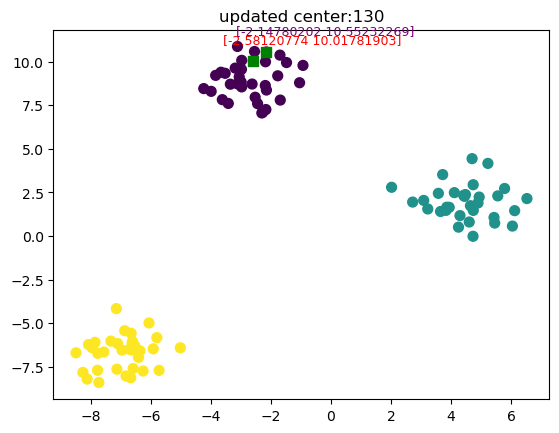

updated centroid:131 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


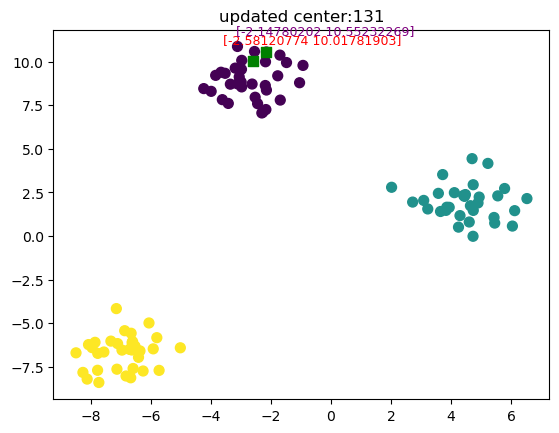

updated centroid:132 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


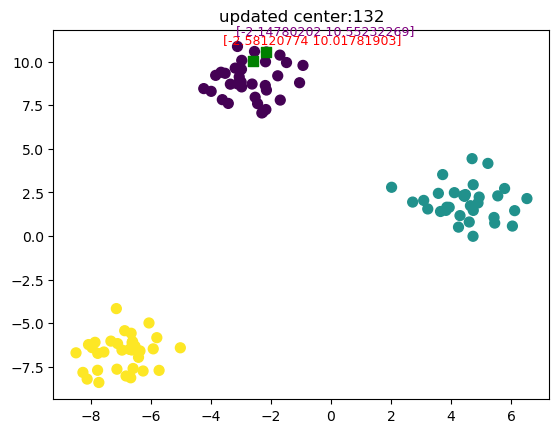

updated centroid:133 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


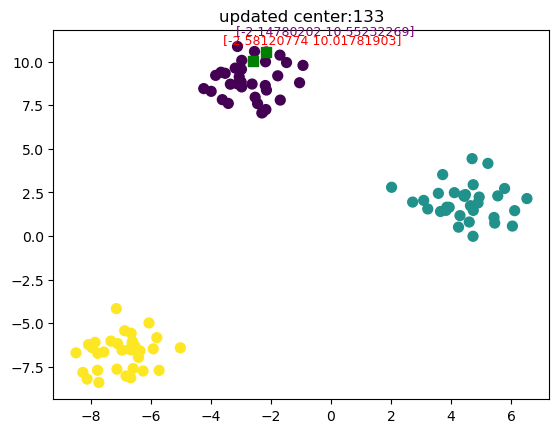

updated centroid:134 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


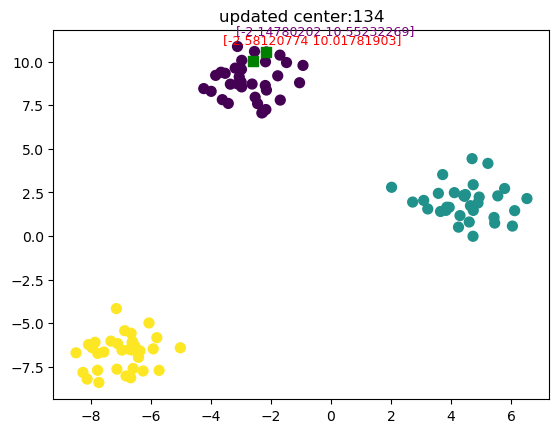

updated centroid:135 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


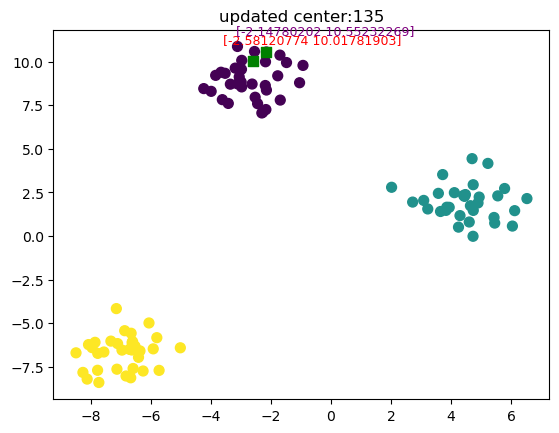

updated centroid:136 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


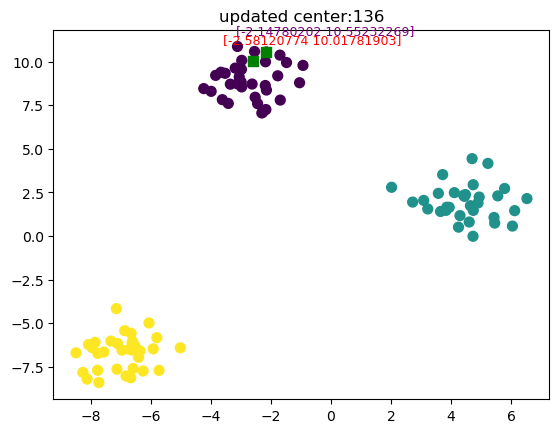

updated centroid:137 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


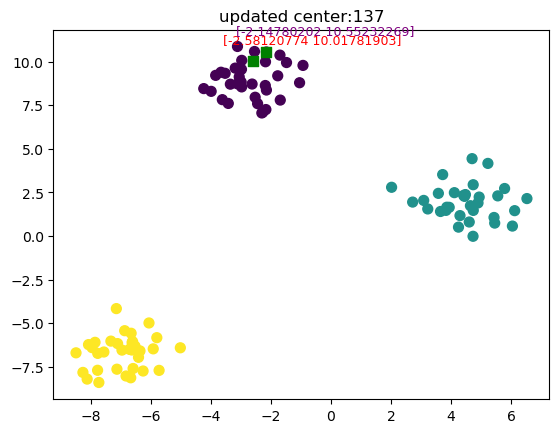

updated centroid:138 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


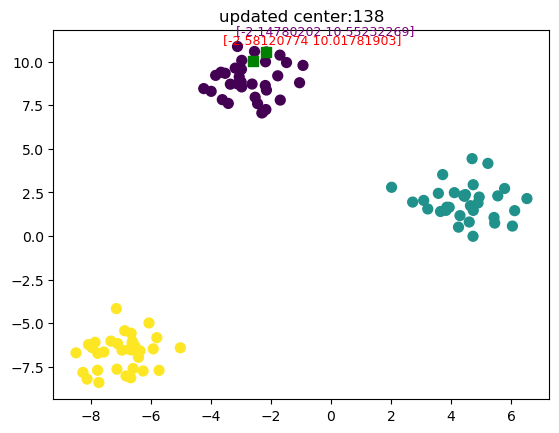

updated centroid:139 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


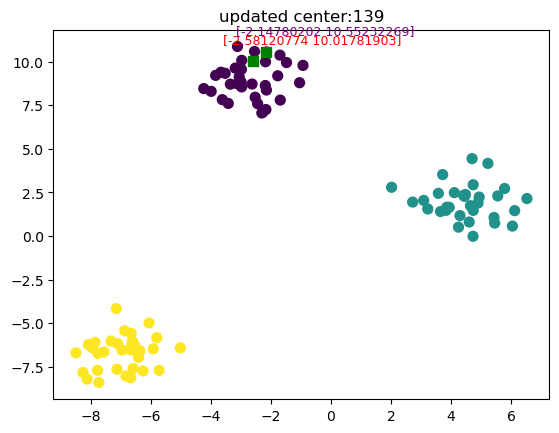

updated centroid:140 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


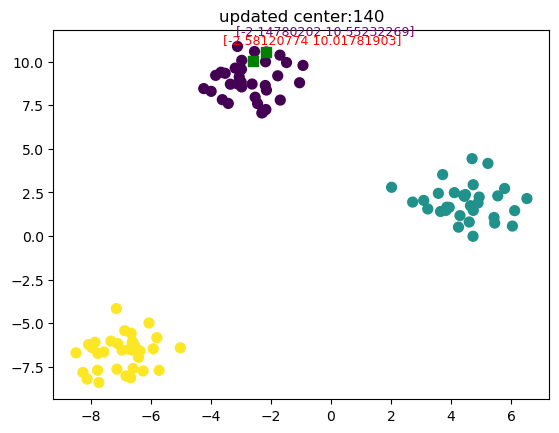

updated centroid:141 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


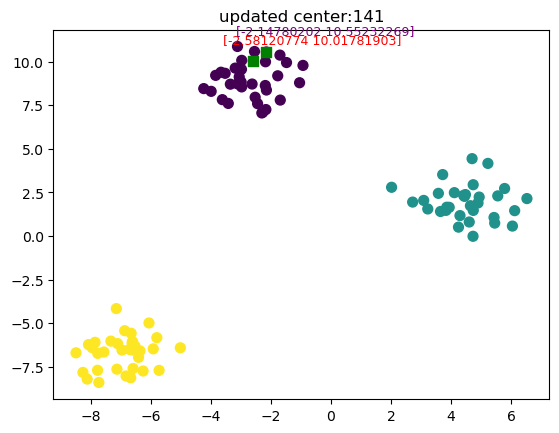

updated centroid:142 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


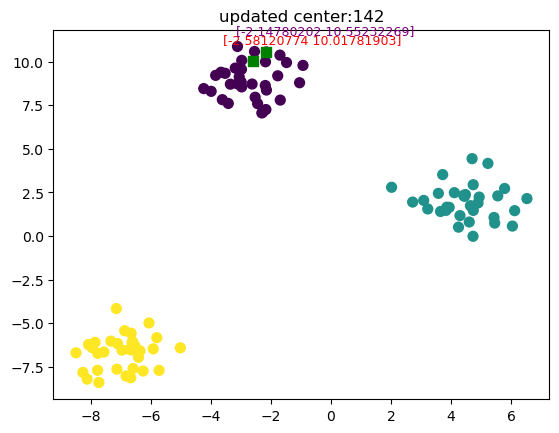

updated centroid:143 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


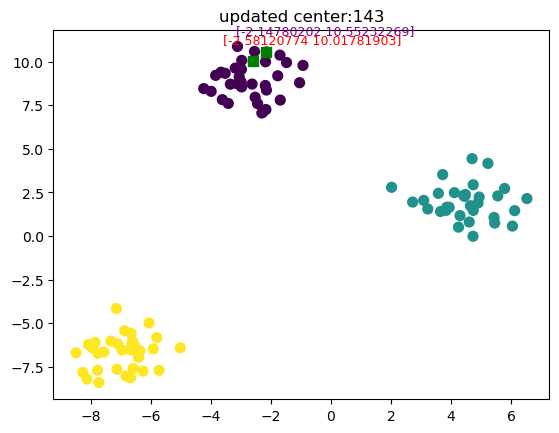

updated centroid:144 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


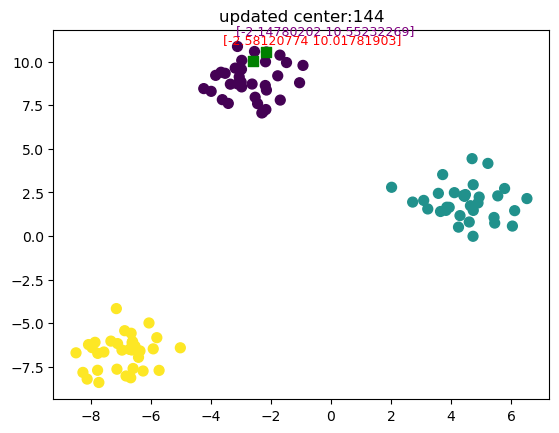

updated centroid:145 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


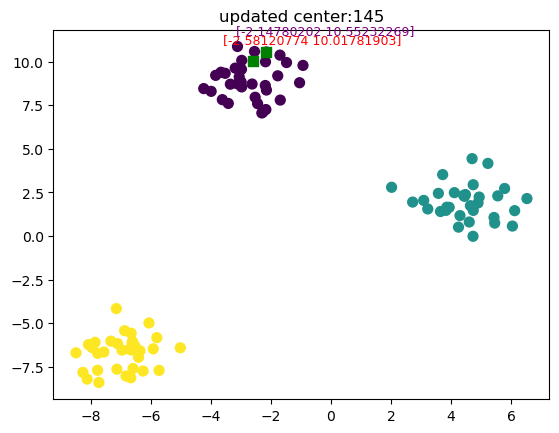

updated centroid:146 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


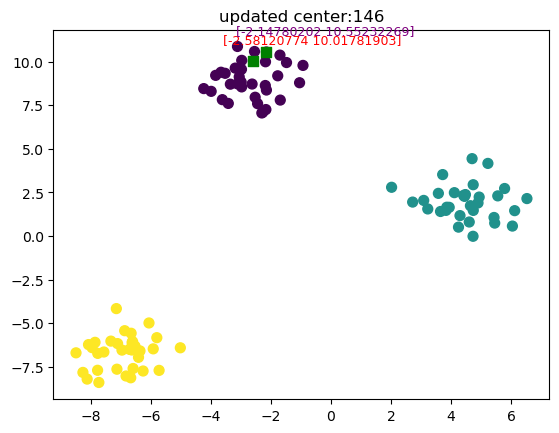

updated centroid:147 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


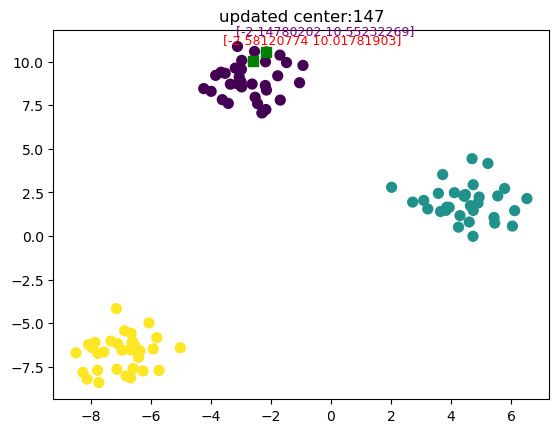

updated centroid:148 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


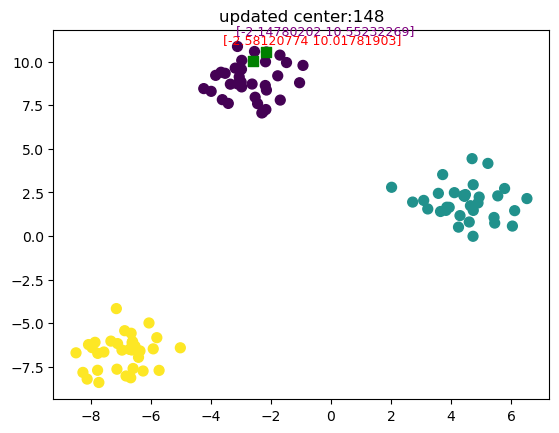

updated centroid:149 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


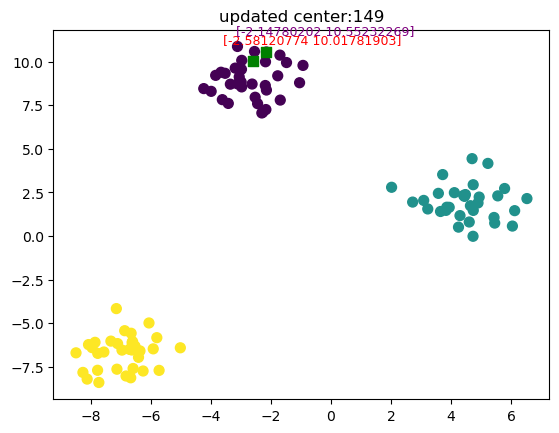

updated centroid:150 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


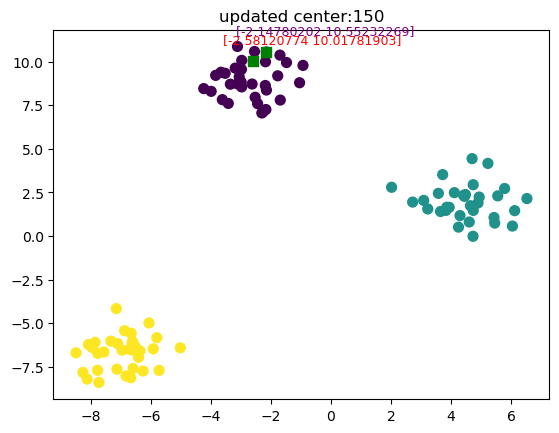

updated centroid:151 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


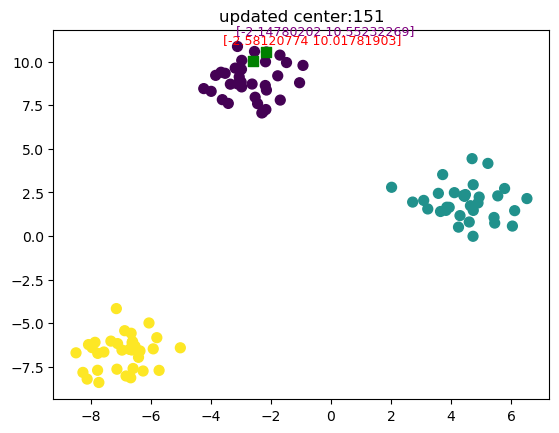

updated centroid:152 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


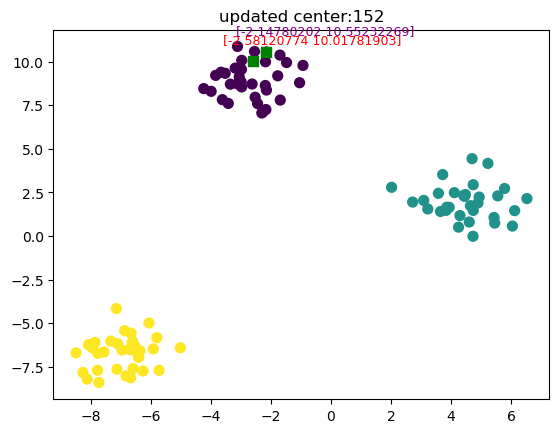

updated centroid:153 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


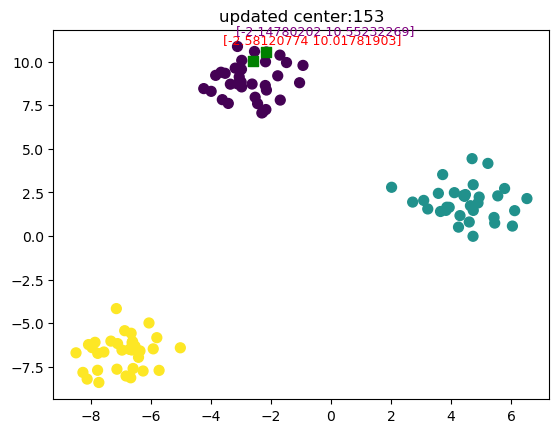

updated centroid:154 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


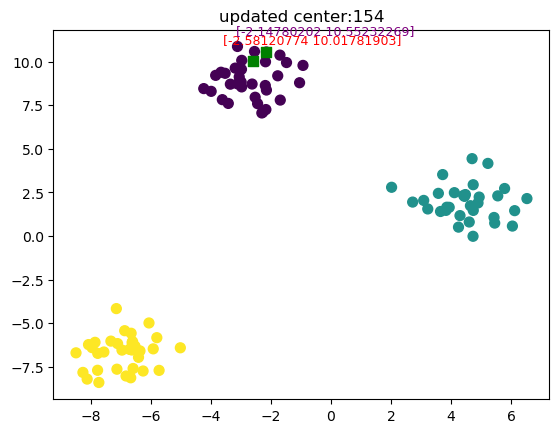

updated centroid:155 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


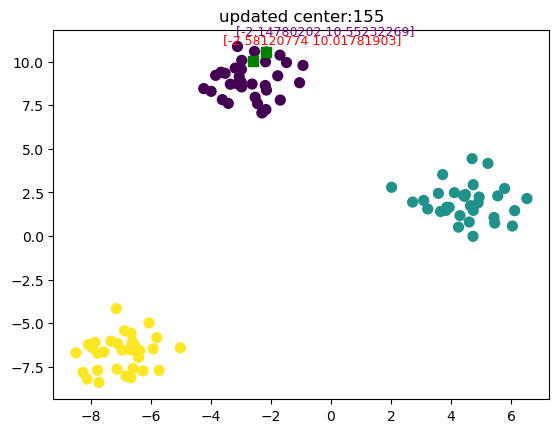

updated centroid:156 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


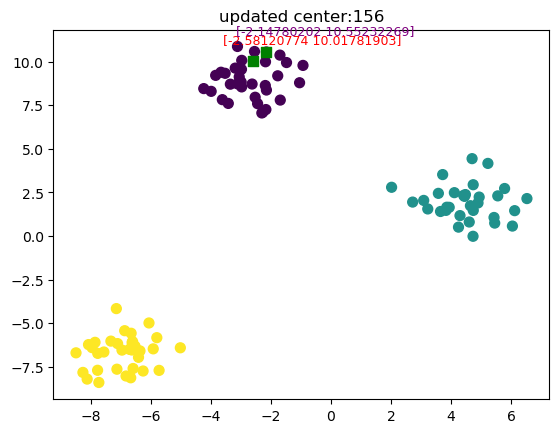

updated centroid:157 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


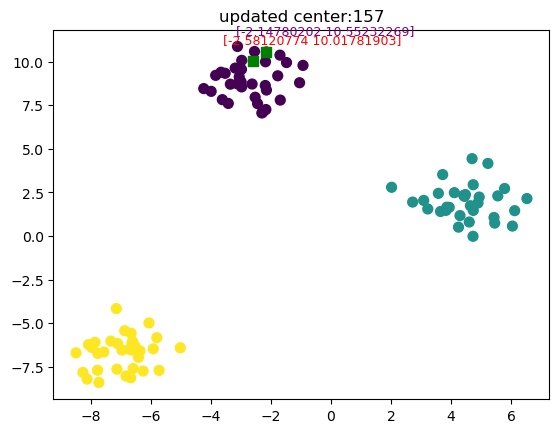

updated centroid:158 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


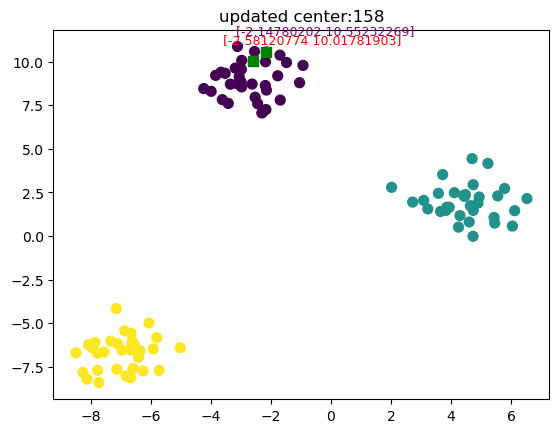

updated centroid:159 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


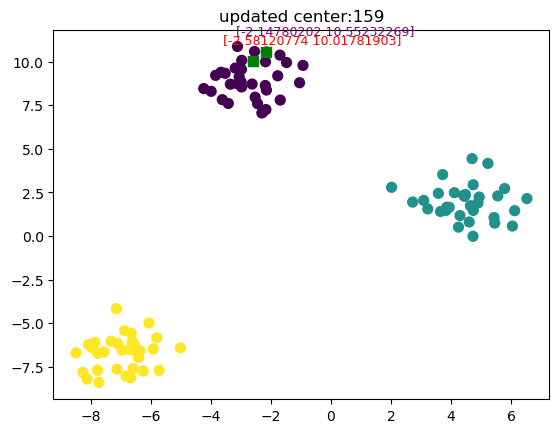

updated centroid:160 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


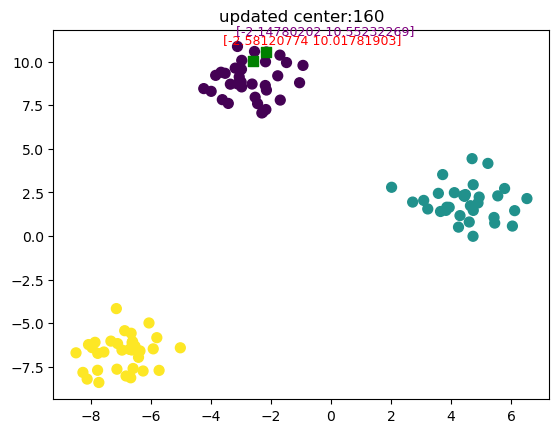

updated centroid:161 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


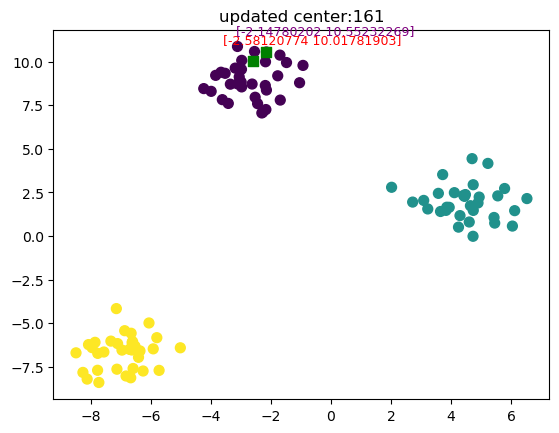

updated centroid:162 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


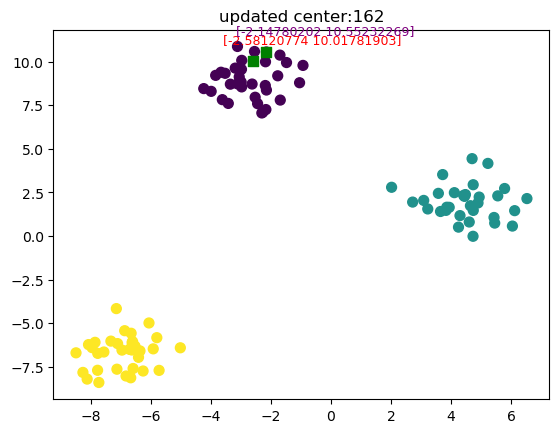

updated centroid:163 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


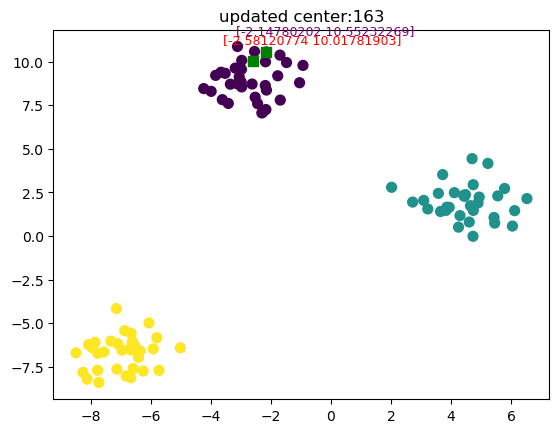

updated centroid:164 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


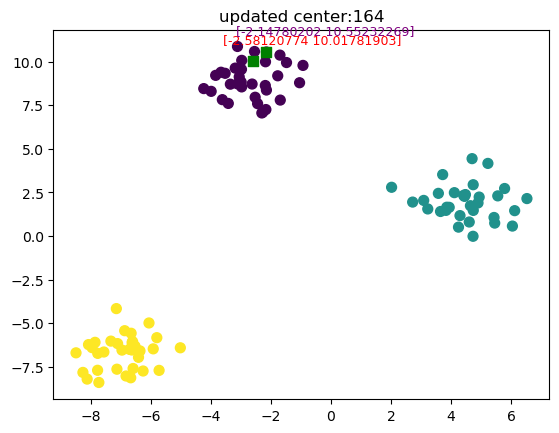

updated centroid:165 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


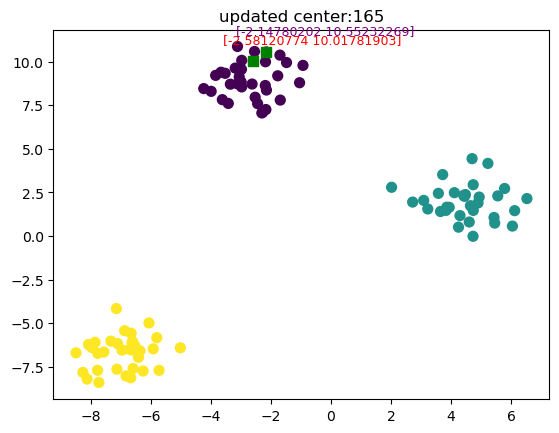

updated centroid:166 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


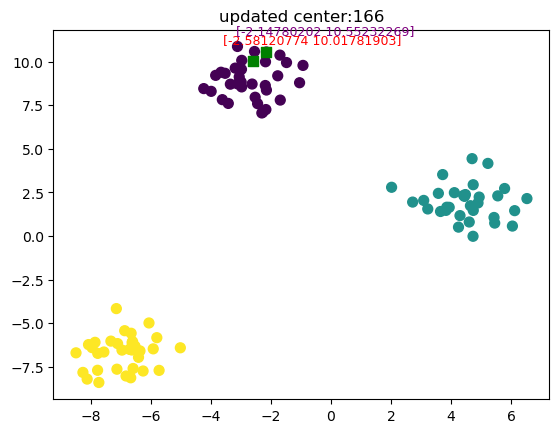

updated centroid:167 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


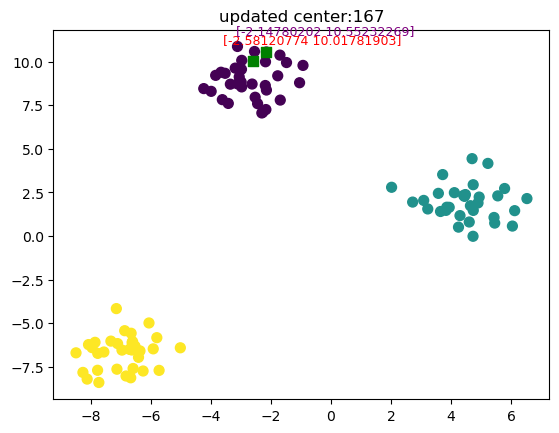

updated centroid:168 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


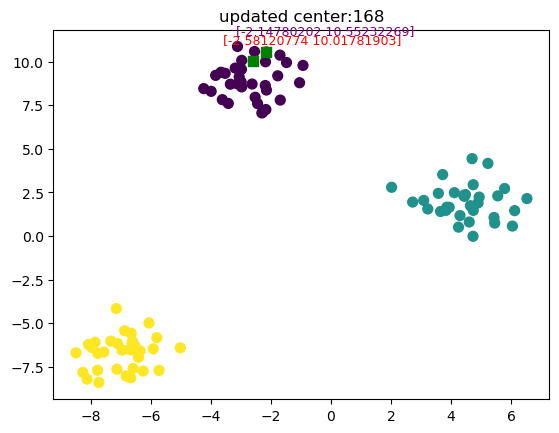

updated centroid:169 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


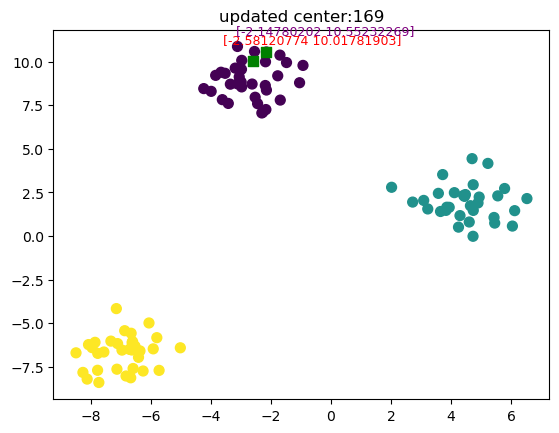

updated centroid:170 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


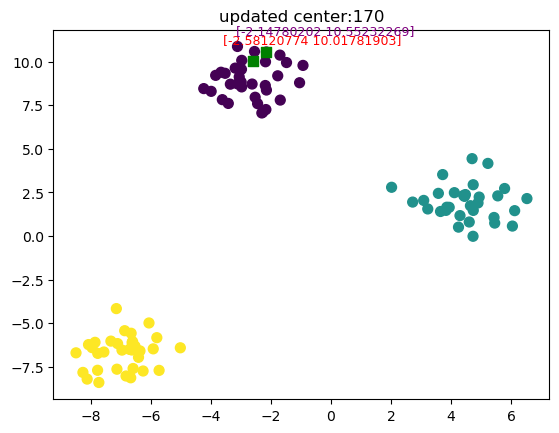

updated centroid:171 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


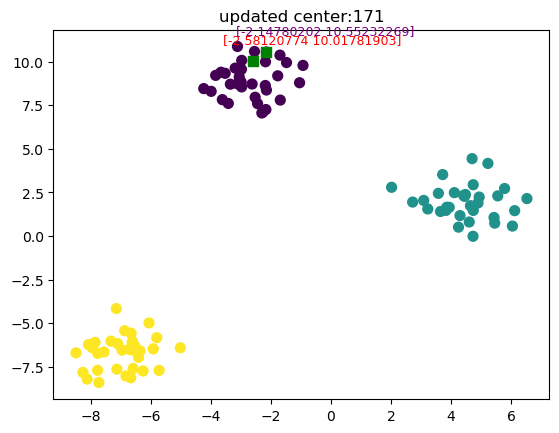

updated centroid:172 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


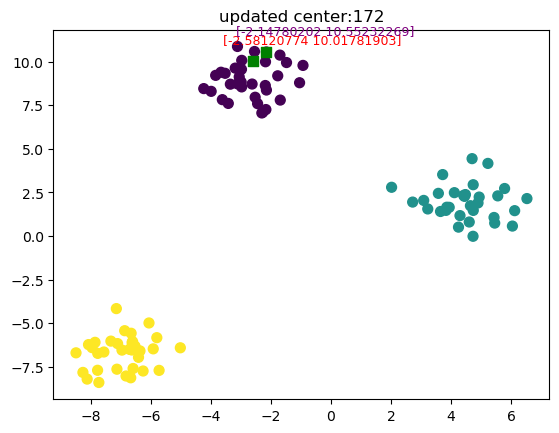

updated centroid:173 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


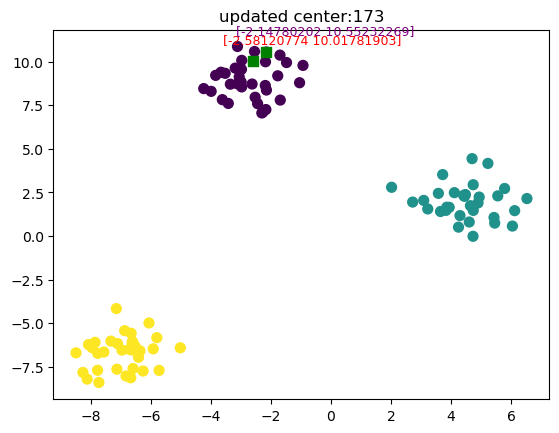

updated centroid:174 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


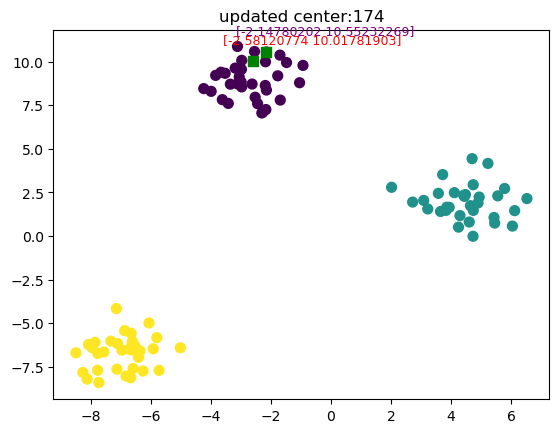

updated centroid:175 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


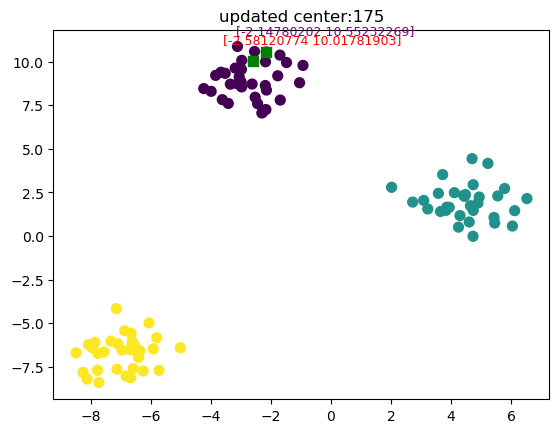

updated centroid:176 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


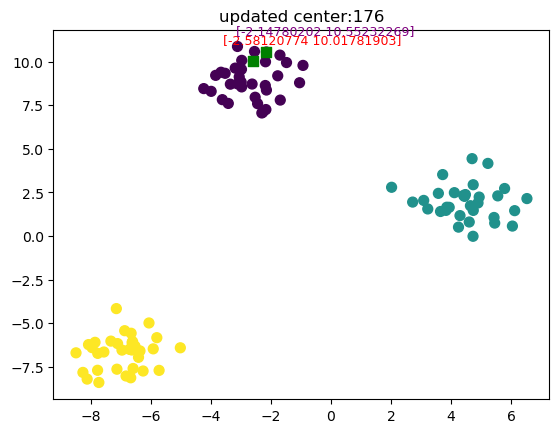

updated centroid:177 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


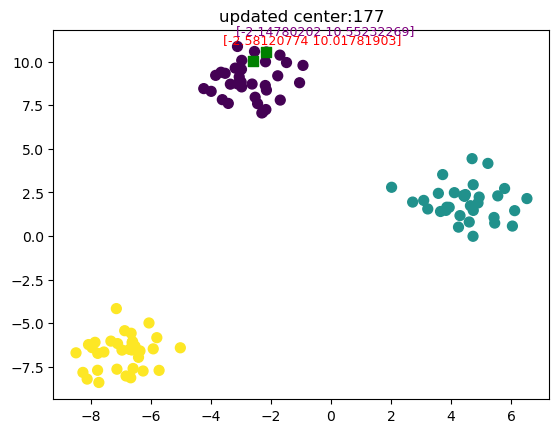

updated centroid:178 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


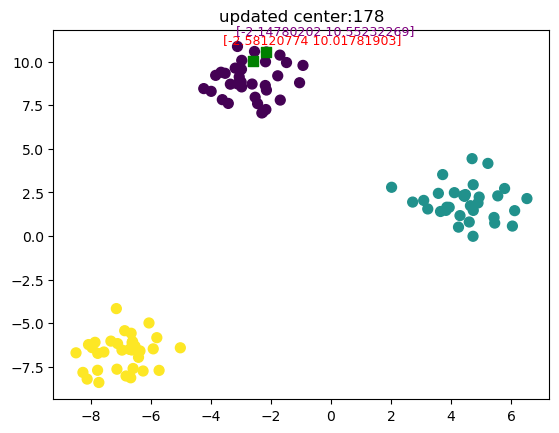

updated centroid:179 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


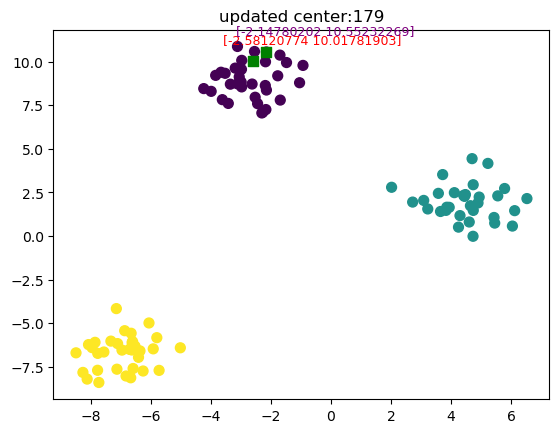

updated centroid:180 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


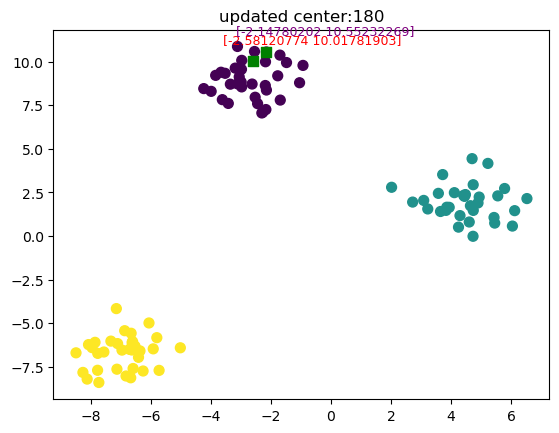

updated centroid:181 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


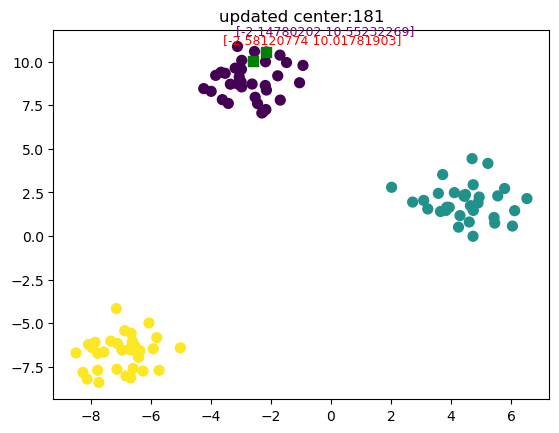

updated centroid:182 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


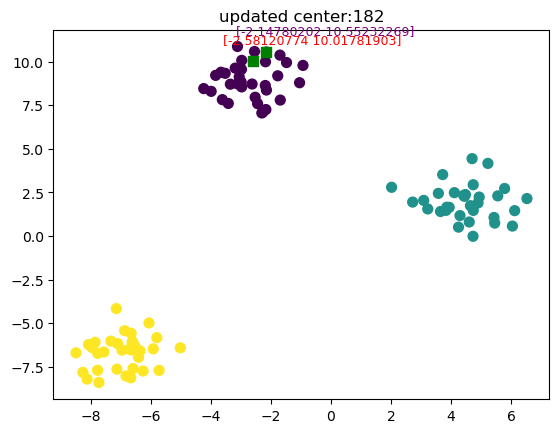

updated centroid:183 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


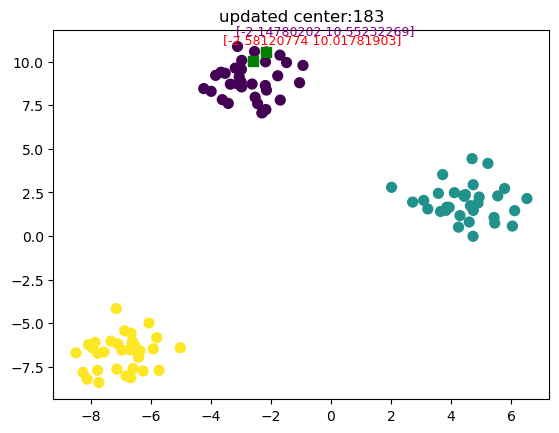

updated centroid:184 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


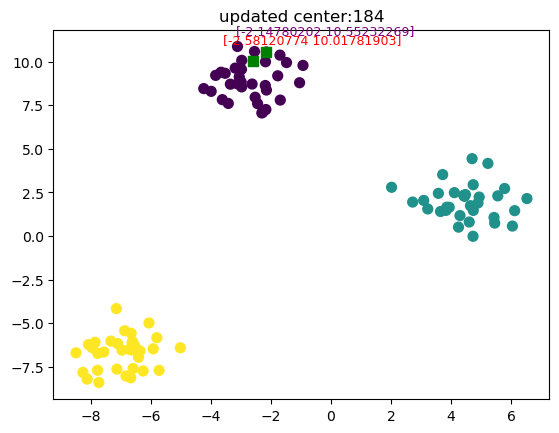

updated centroid:185 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


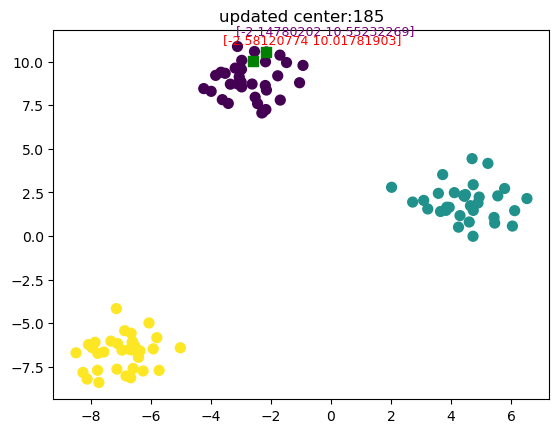

updated centroid:186 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


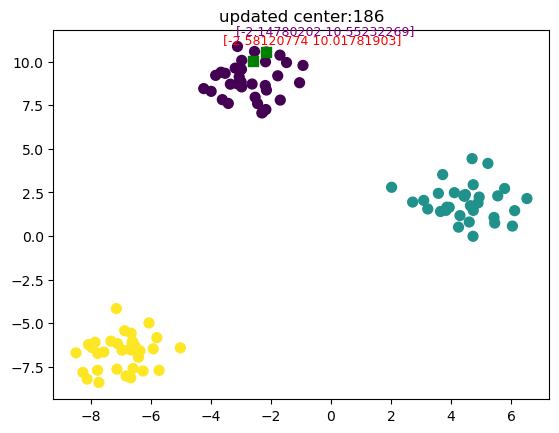

updated centroid:187 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


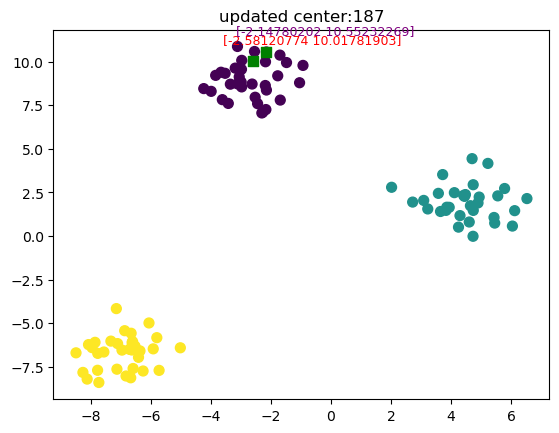

updated centroid:188 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


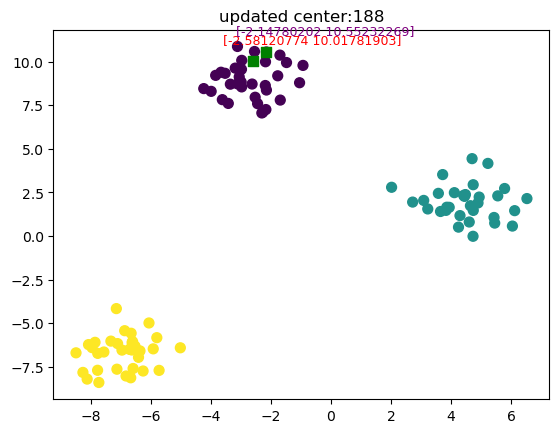

updated centroid:189 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


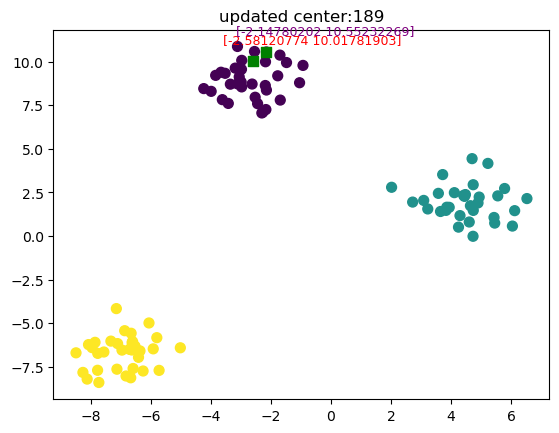

updated centroid:190 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


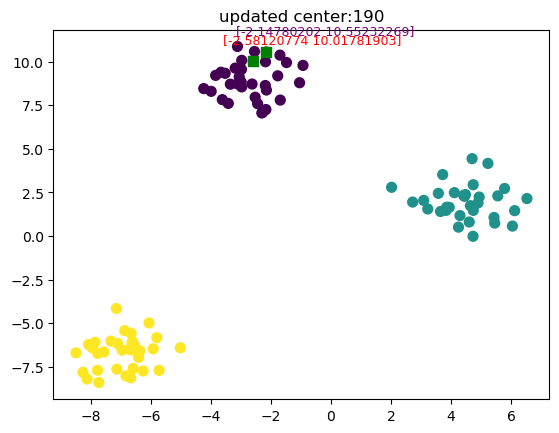

updated centroid:191 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


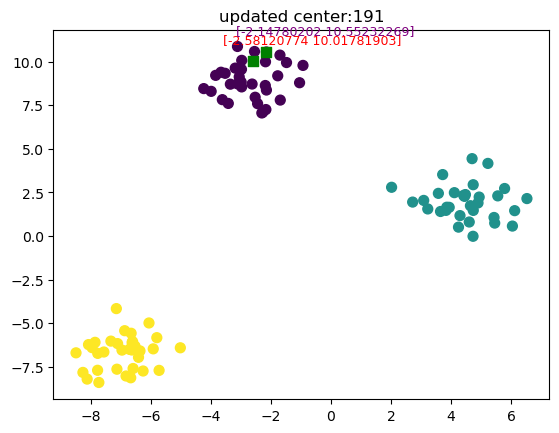

updated centroid:192 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


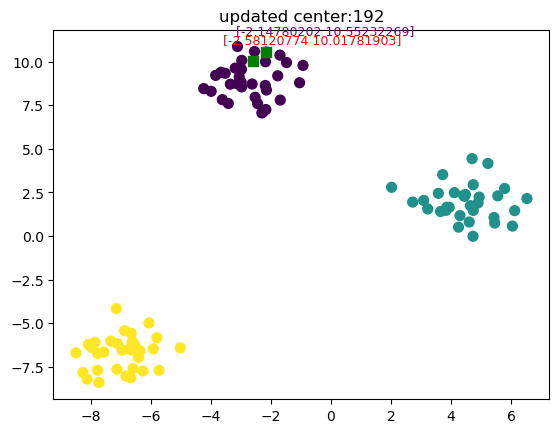

updated centroid:193 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


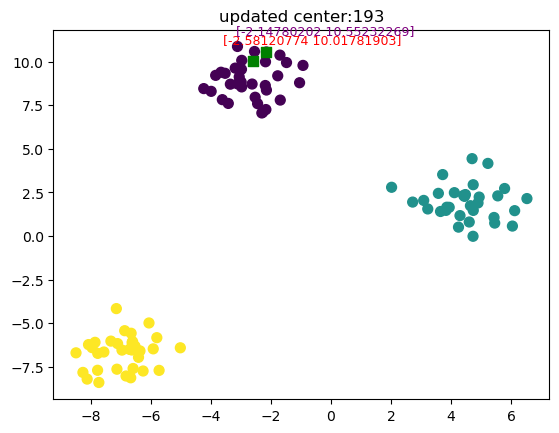

updated centroid:194 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


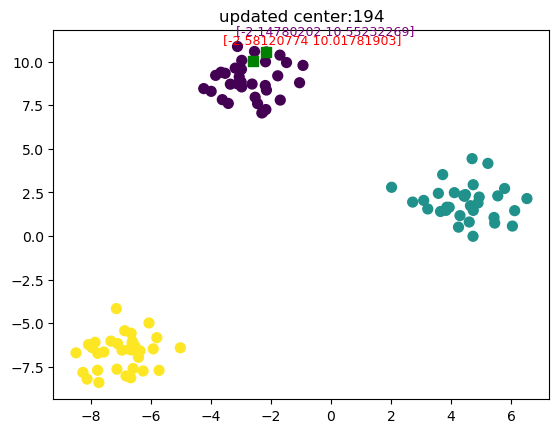

updated centroid:195 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


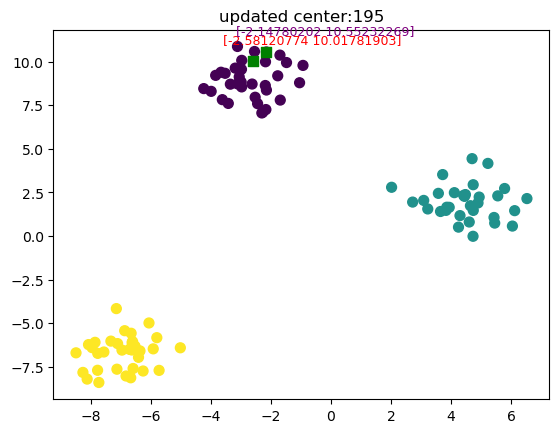

updated centroid:196 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


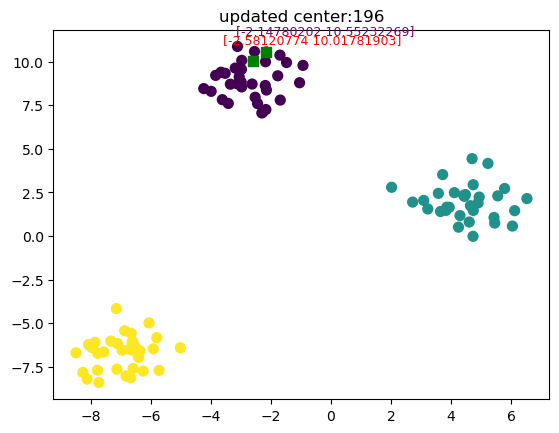

updated centroid:197 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


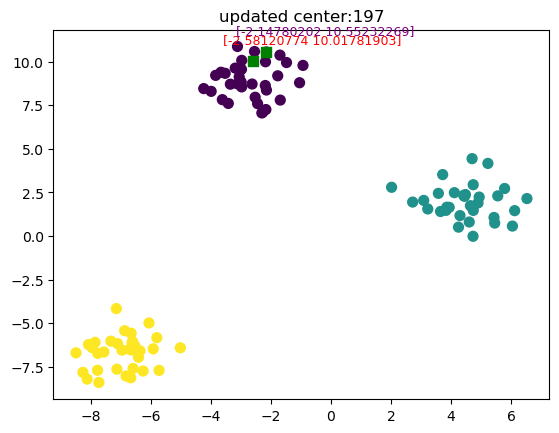

updated centroid:198 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


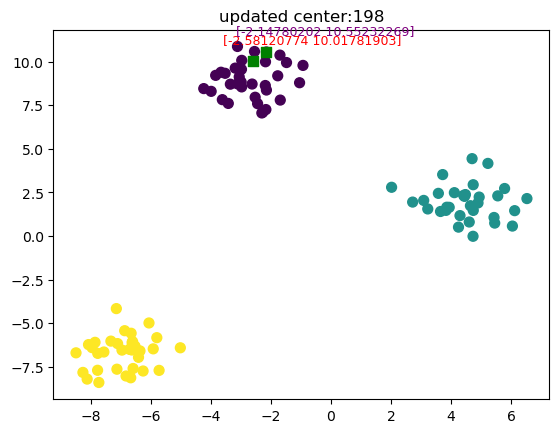

updated centroid:199 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


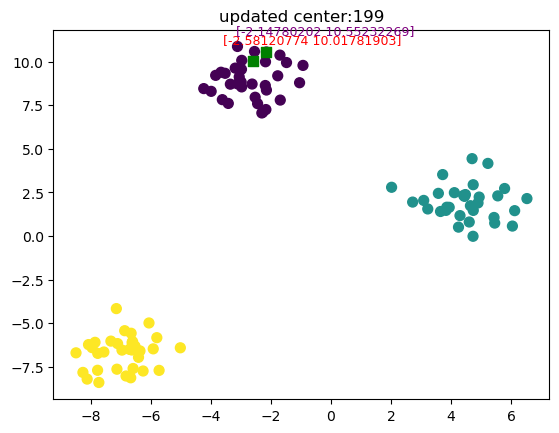

updated centroid:200 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


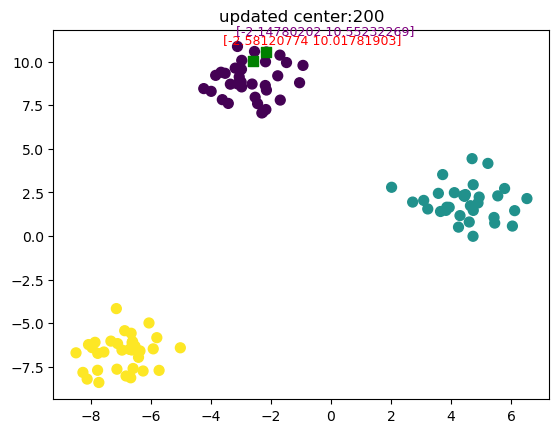

updated centroid:201 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


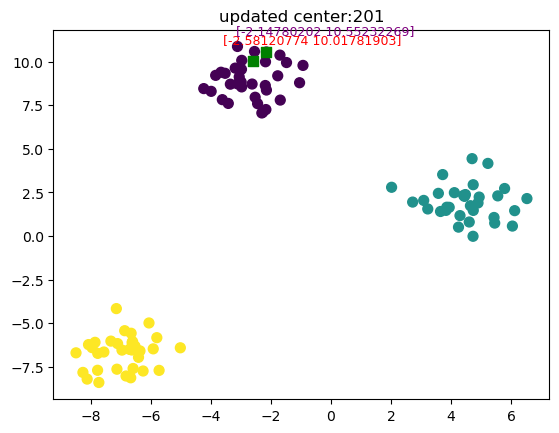

updated centroid:202 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


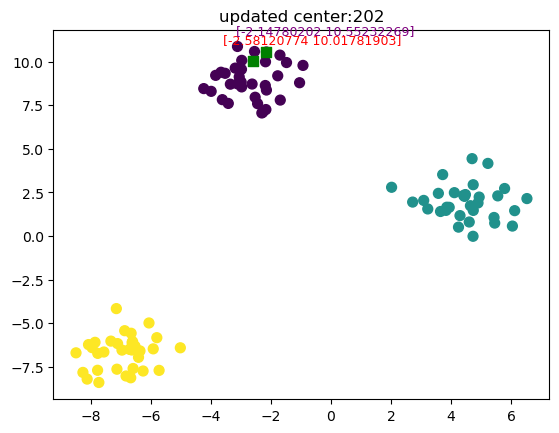

updated centroid:203 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


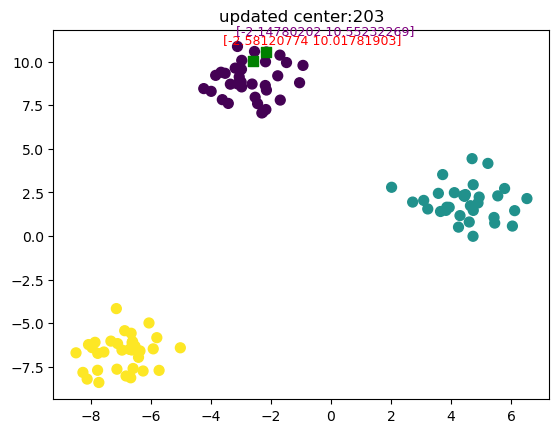

updated centroid:204 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


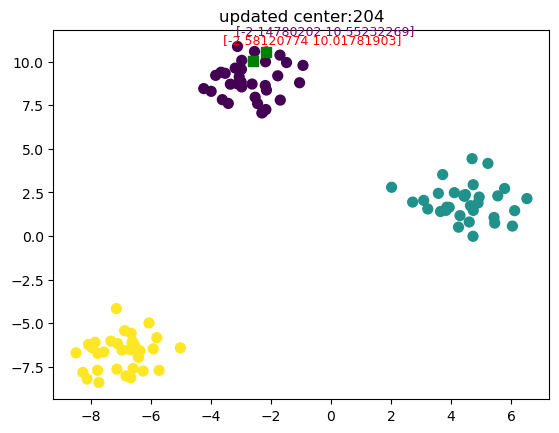

updated centroid:205 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


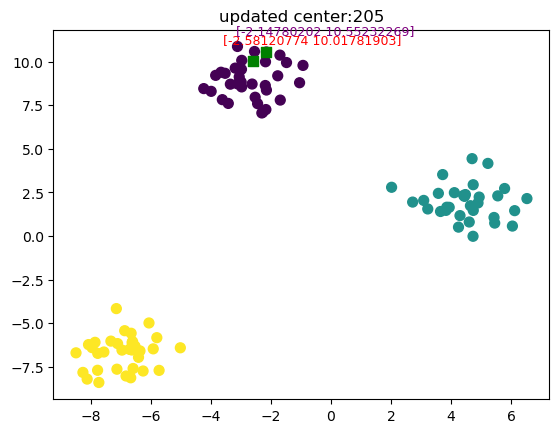

updated centroid:206 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


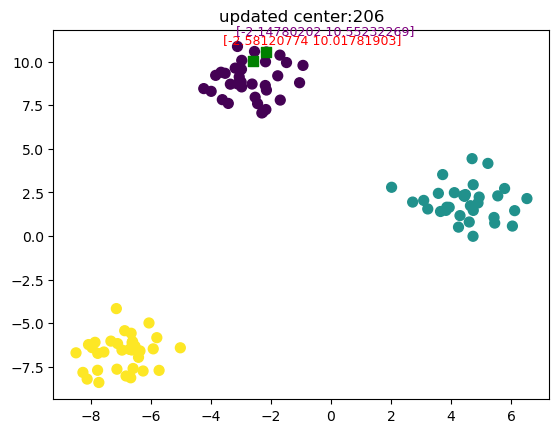

updated centroid:207 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


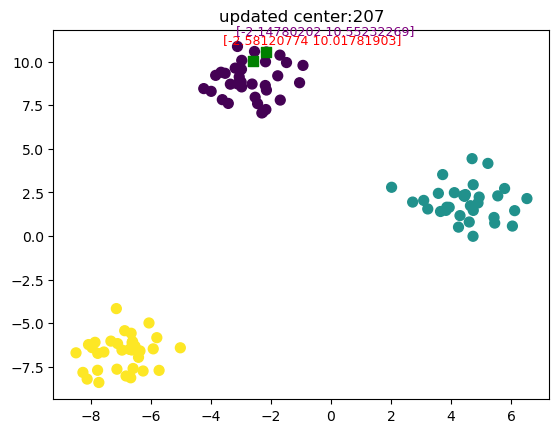

updated centroid:208 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


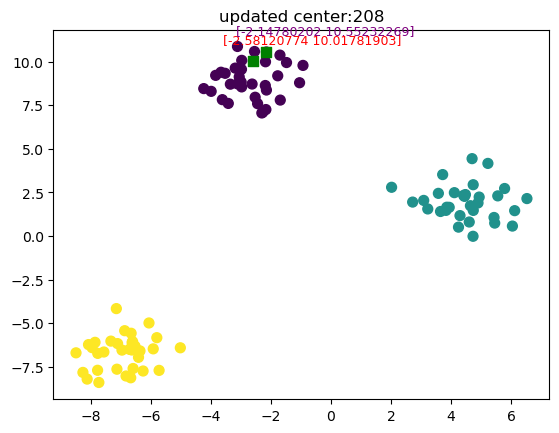

updated centroid:209 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


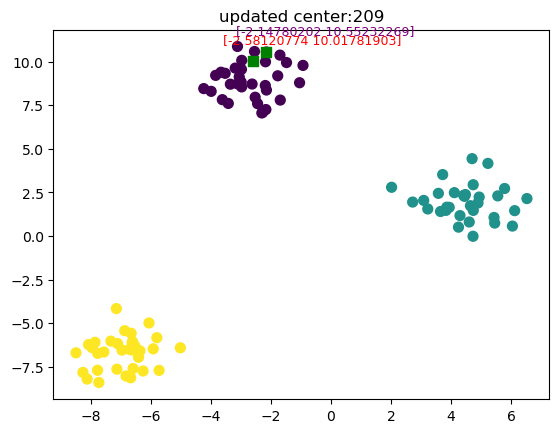

updated centroid:210 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


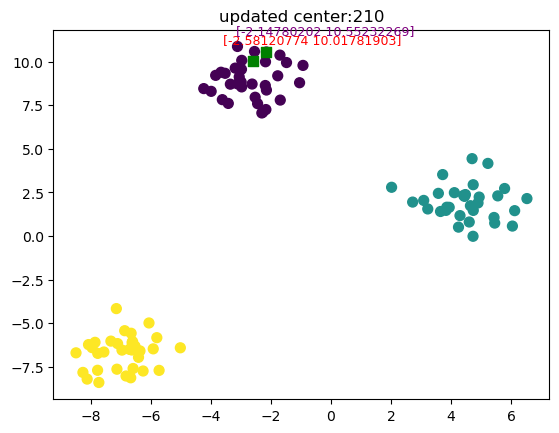

updated centroid:211 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


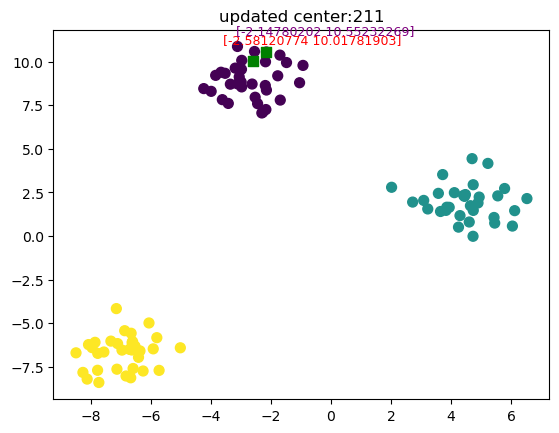

updated centroid:212 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


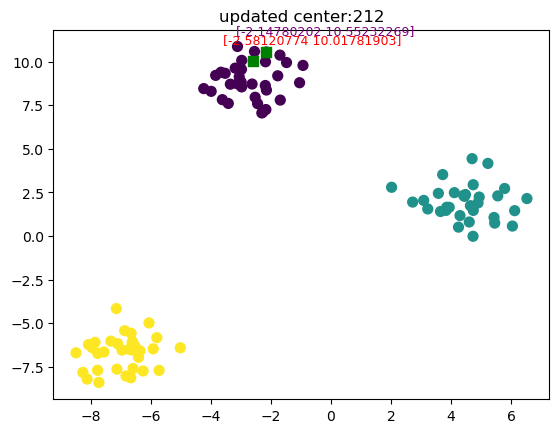

updated centroid:213 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


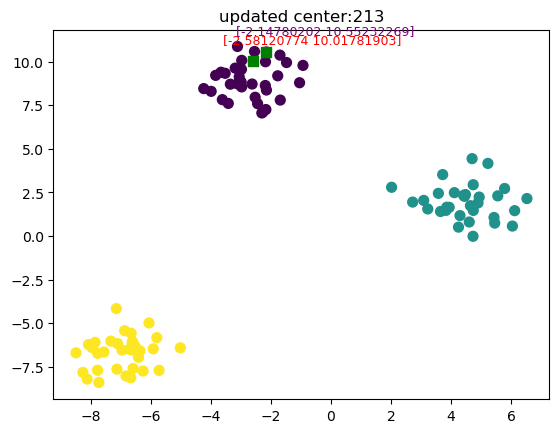

updated centroid:214 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


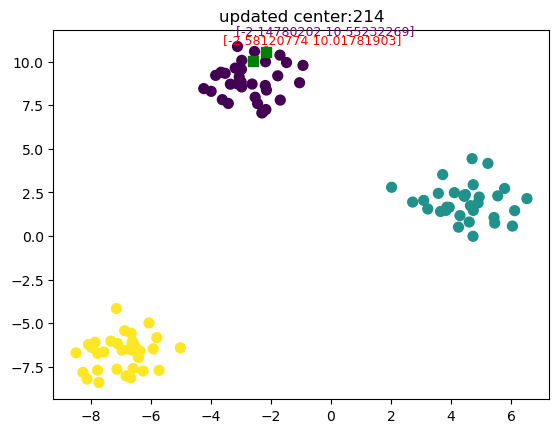

updated centroid:215 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


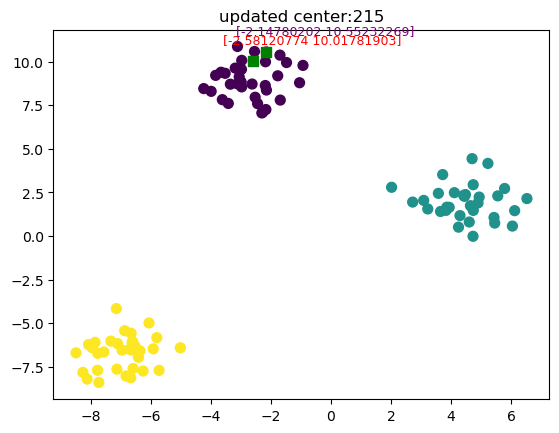

updated centroid:216 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


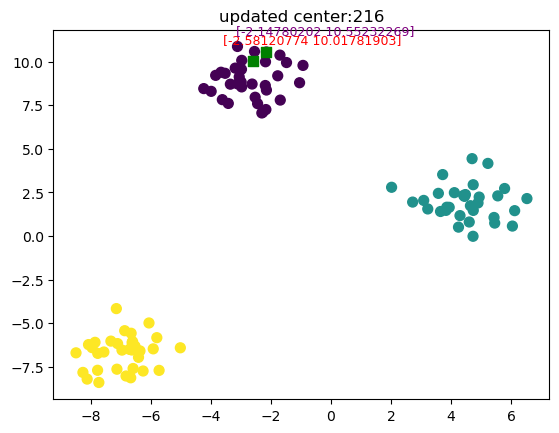

updated centroid:217 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


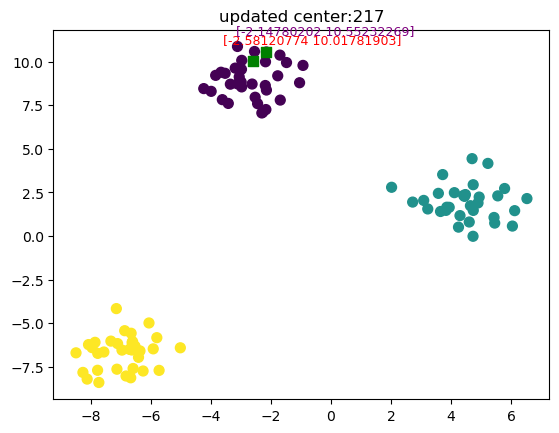

updated centroid:218 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


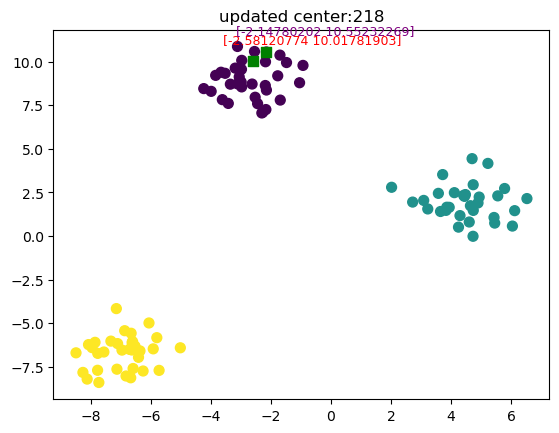

updated centroid:219 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


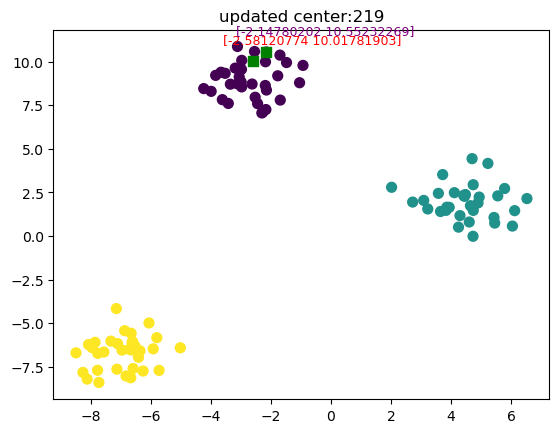

updated centroid:220 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


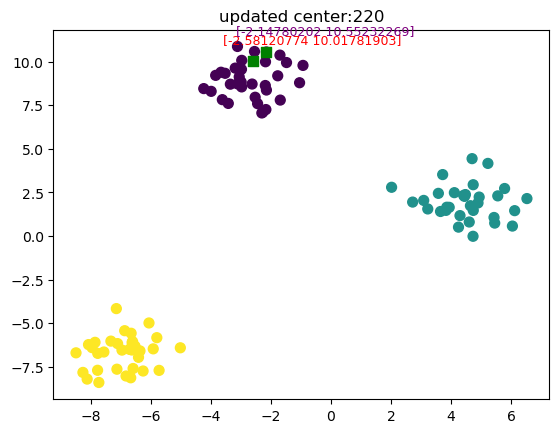

updated centroid:221 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


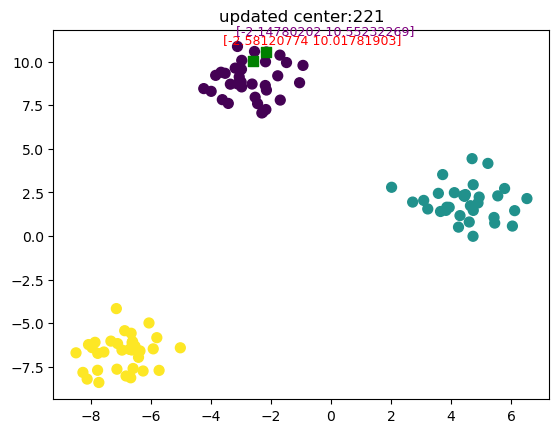

updated centroid:222 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


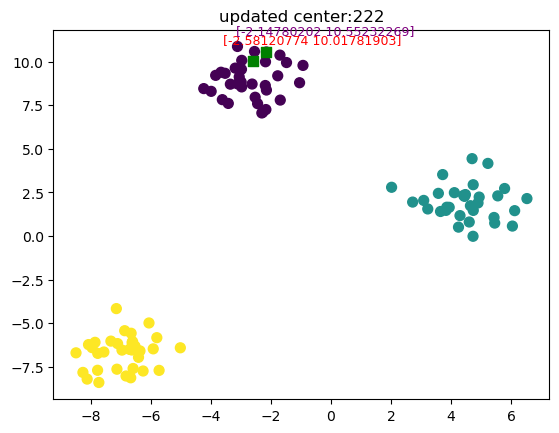

updated centroid:223 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


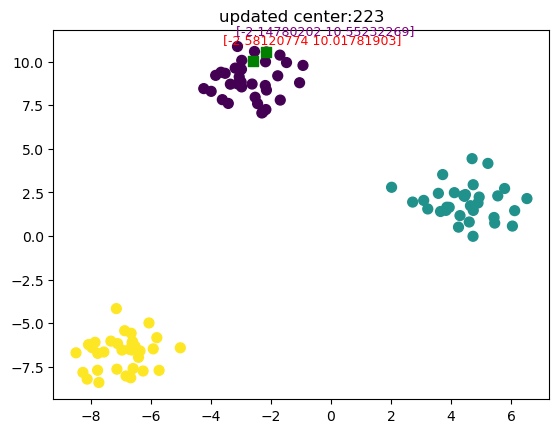

updated centroid:224 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


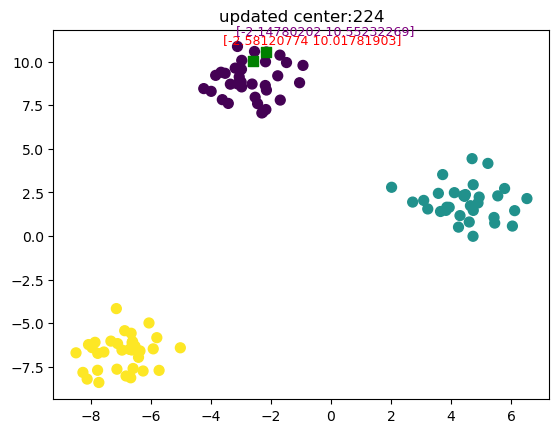

updated centroid:225 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


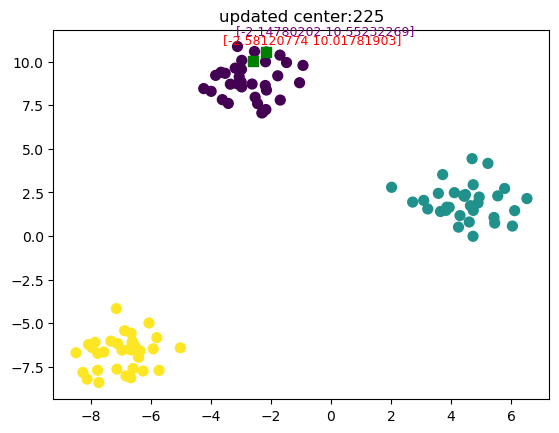

updated centroid:226 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


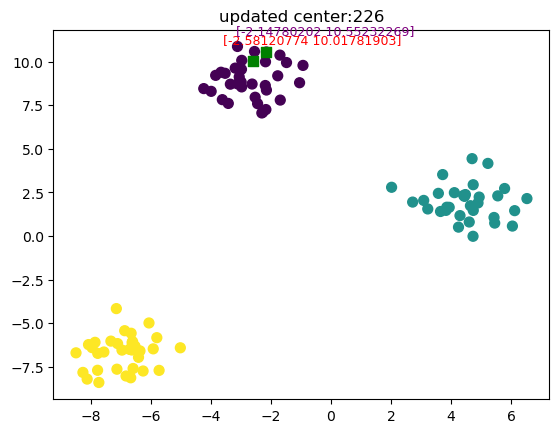

updated centroid:227 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


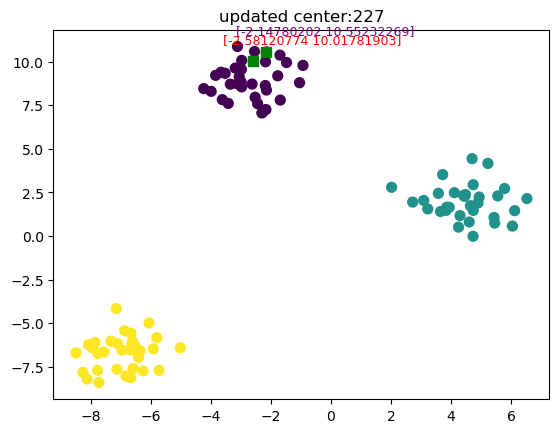

updated centroid:228 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


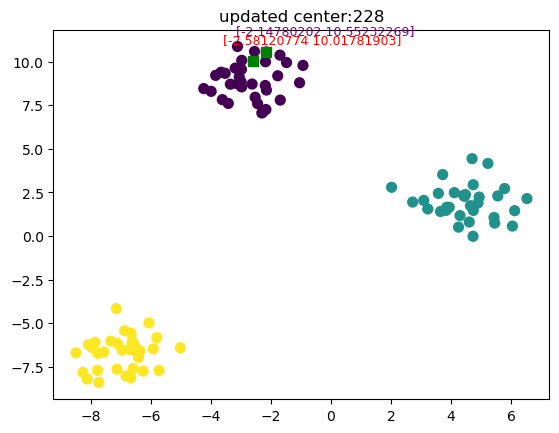

updated centroid:229 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


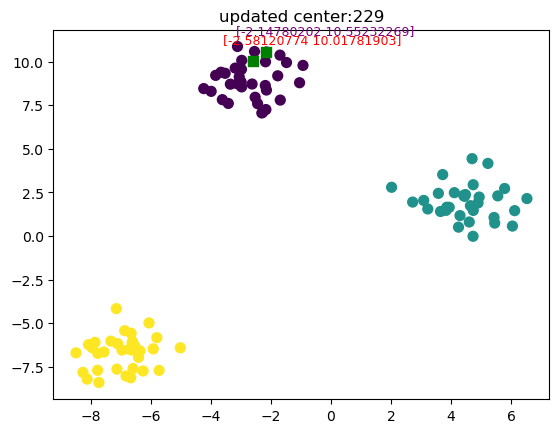

updated centroid:230 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


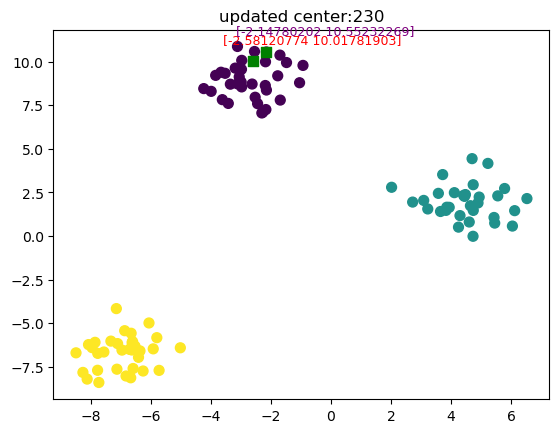

updated centroid:231 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


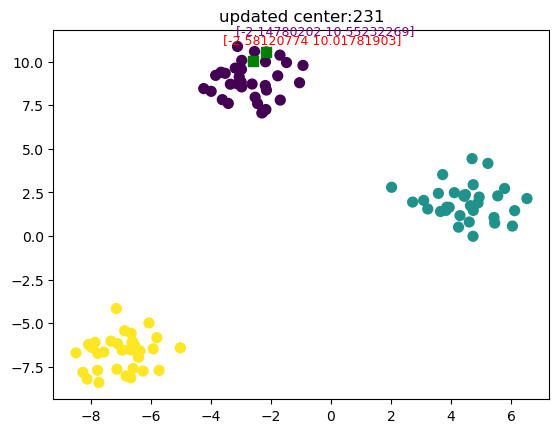

updated centroid:232 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


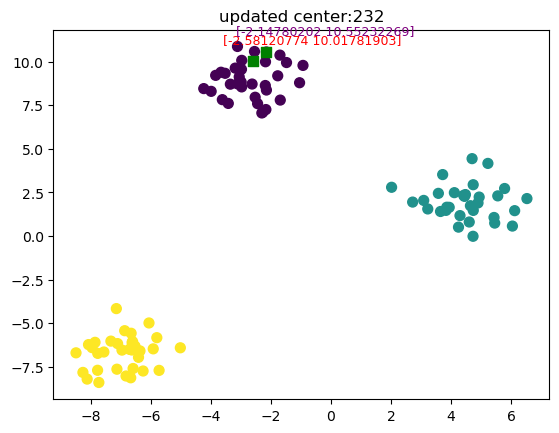

updated centroid:233 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


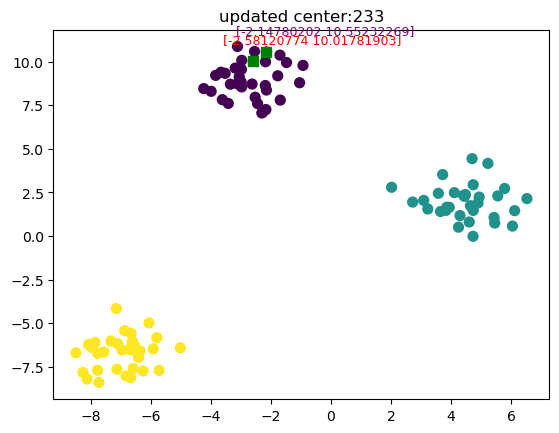

updated centroid:234 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


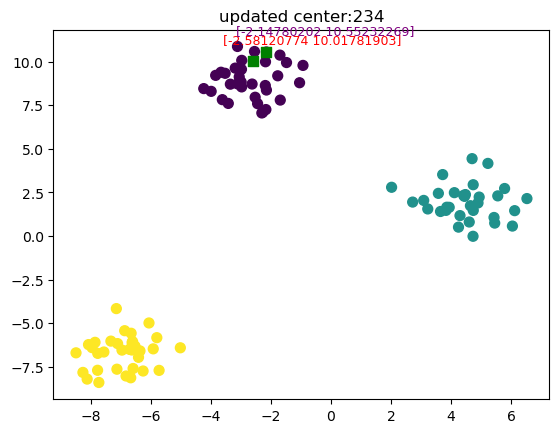

updated centroid:235 [[-1.78784017  0.97970623]
 [-0.59515741  9.23211517]]


C:\Users\22anj\AppData\Local\Temp\ipykernel_12804\3696718066.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["label"+str(j)]=labels
C:\Users\22anj\anaconda3\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


In [ ]:
def kmeans(df,n_cluster,x,y,r_seed=8):
    random_state=np.random.RandomState(r_seed)
    i=random_state.permutation(x.shape[0])[:n_cluster]
    centroid=x[i]
    print('initial cluster:',centroid)
    
    plt.title('initial plot of centroid')
    plt.scatter(x[:,0],x[:,1],c=y,s=50,cmap='viridis')
    plt.scatter(centroid[:,0],centroid[:,1],s=50,marker='x',color='orange',label='centroid')
    plt.text(centroid[0][0]+0.2,centroid[0][1]+0.5,centroid[0],fontsize=9,color='grey')
    plt.text(centroid[1][0]+0.2,centroid[1][1]+0.5,centroid[1],fontsize=9,color='blue')
    plt.show()
    j=1
    while True:
        labels=pairwise_distances_argmin(x,centroid)
        new_center=np.array([x[labels==i].mean(0) for i in range(n_cluster)])
        print('updated centroid:'+str(j),new_center)
        if np.all(centroid==new_center):
            break
        centroid==new_center
        df["label"+str(j)]=labels
        plt.title('updated center:'+str(j))
        plt.scatter(x[:,0],x[:,1],c=y,s=50,cmap='viridis')
        plt.scatter(centroid[:,0],centroid[:,1],s=50,marker='s',color='green',label='updated')
        plt.text(centroid[0][0]-1,centroid[0][1]+1,centroid[0],fontsize=9,color='red')
        plt.text(centroid[1][0]-1,centroid[1][1]+1,centroid[1],fontsize=9,color='purple')
        plt.show()
        j=j+1
    return labels,centroid

kmeans(df,2,x,y,8)
    


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,accuracy_score

In [ ]:
K=KMeans(n_clusters=3,random_state=42)
K.fit(df)

In [ ]:
y_pred=K.predict(df)
silhouettescore=silhouette_score(df,y_pred)

In [ ]:
print('accuracy:',silhouettescore)

In [ ]:
KMeans=K.cluster_centers_

In [ ]:
print('cluster',KMeans)

In [ ]:
plt.scatter(x[:,0],x[:,1],c=y,cmap='viridis',s=50)
plt.scatter(KMeans[:,0],KMeans[:,1],s=50,marker='s',c='cyan')

In [ ]:
wcss=[]
for k in range (1,9):
    K=KMeans(n_clusters=k,random_state=42)
    K.fit(x)
    wcss.append(K.inertia_)
    
plt.plot(range(df),wcss,marker='*',linestyle='--')
plt.show()

In [ ]:
# KNN

import numpy as np
import pandas as pd
from sklearn import datasets
from sklearn.datasets import make_blobs

In [ ]:
x,y=datasets.make_blobs(n_samples=20,n_features=1,centers=None,random_state=0)
df1=pd.DataFrame(x,columns=['number'])
df1['target']=y
df1.head()

In [ ]:
df1['target'].unique()

In [ ]:
def KNN(point,df1):
    distance=[]
    for i in df1:
        s=0
        for j in range(len(df1[0])):
            s+=(i[j]-point[j])**2
        distance.append(np.sqrt(s))
    return distance
D=KNN((2,3),x)
df1['Distance']=D
df1.sort_values('Distance',inplace=True)

In [ ]:
df1.head()

In [ ]:
k=6
r=df1['target'][:k]
print(r)
print('class',r.mode().values)